# Reduce April 28th data: J163620 (Green+2022)



SDSSJ163620.38+475838.36  Green+2022  red&blue center 

"163620.38+475838.36: There is a complete disappearance of broad Hβ emission in this CLQ, while the continuum dimming is rather quite modest. Judging from the photometric points, the early epoch spectrum would likely have been much more spectacular had it been obtained about a year earlier. From bright to dim state, the spectrum effectively changes from a Type 1.5 to a Type 1.8."

Show info about that object from Green+2022 Table 2: 

In [1]:
from astropy.table import Table
green = Table.read('Green_2022_Table2.txt', format='ascii')

In [3]:
m = green['SDSS'] == 'J163620.38+475838.36'
green[m]

SDSS,Sel,zspec,MJD,Fac,Nsigma,State,L3240,e_L3240,L5100,e_L5100,LHb,e_LHb,L2800,e_L2800,LMgII,e_LMgII,Notes
,,,d,,,,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,1e+35 W,
str20,str11,float64,int64,str6,float64,str1,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str19
J163620.38+475838.36,DE,0.236,52144,SDSS,3.81,B,66.1,0.7,84.4,1.3,0.54,0.02,--,--,--,--,CLQ
J163620.38+475838.36,DE,0.236,58257,eBOSS,--,D,28.6,0.3,34.2,0.5,0.09,0.02,--,--,--,--,--


In [18]:
import sys
sys.path.append('/Users/chris/GradResearch/kosmos/')
#import kosmos
 # need notebook backend for interaction
#%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt

# file-handling stuff for user, options abound! I like Tables and Pandas DataFrames
import pandas as pd
from astropy.table import Table
from astropy import units as u
from astropy.io import fits
import os
# import kosmos... if we do it right this should be the only other thing to import someday!
import sys  
sys.path.append('..')

import kosmos
kosmos.__version__

'0.1'

Check if it's in Schneider+2010:

In [187]:
dr7 = Table.read('dr7qso_table.txt', format='ascii')

names = ['163620.38+475838.3']
m = np.in1d(dr7['SDSS_NAME'],names)
dr7[m]

SDR7ID,SDSS_NAME,RA,DEC,REDSHIFT
int64,str18,float64,float64,float64
96362,163620.38+475838.3,249.084925,47.977324,0.2361


In [ ]:
Somehow it's in Schneider+2010! How could it be not in DR16Q ?  

ok - there is something! Get the photometry:

In [5]:
sdss3obs = Table.read('dm_3obsDR7.dat.gz', format='ascii')
m = sdss3obs['col1'] == 96362
sdss3obs[m]

col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40,col41,col42,col43,col44,col45,col46,col47,col48,col49,col50,col51
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


In [7]:
sdss2obs = Table.read('dm_2obsDR7.dat.gz', format='ascii')
m = sdss2obs['col1'] == 96362
sdss2obs[m]

col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30,col31,col32,col33,col34,col35,col36,col37,col38,col39,col40
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


In [8]:
sdss1obs = Table.read('dm_1obsDR7.dat.gz', format='ascii')
m = sdss1obs['col1'] == 96362
sdss1obs[m]


col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
96362,-25.411,1.1937,9.004,46.267,0.067,0.0,0.0,-9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,52015,19.066,0.023,19.122,0.018,18.802,0.017,18.765,0.019,18.86,0.041


In [9]:
#Store in a more useful way :    
# based on https://faculty.washington.edu/ivezic/cmacleod/qso_dr7/Northern_format_dm.html
    
mjdr = sdss1obs[m]['col19'].data[0]
sdss_r = sdss1obs[m]['col24'].data[0]
sdss_rErr = sdss1obs[m]['col25'].data[0]
sdss_g = sdss1obs[m]['col22'].data[0]
sdss_i = sdss1obs[m]['col26'].data[0]
t = Table([[mjdr], [sdss_r], [sdss_rErr], [sdss_g], [sdss_i]],
     names=['MJDr', 'r','rErr','g','i'])
t.write('SDSS_J163620_single_point_lc.txt', format='ascii')

Check for single-epoch spectra

In [10]:
from astroquery.mast import Mast
from astroquery.sdss import SDSS

xids = {}
for name in names:
    coords = Mast.resolve_object(f'SDSSJ{name}')
    xid = SDSS.query_region(coords, radius='5 arcsec', spectro=True)
    xids[name] = xid

In [8]:
from astroquery.mast import Mast
from astroquery.sdss import SDSS
coords = Mast.resolve_object(f'SDSSJ163620.38+475838.3')
xid = SDSS.query_region(coords, radius='5 arcsec', spectro=True)


In [9]:
xid

ra,dec,objid,run,rerun,camcol,field,z,plate,mjd,fiberID,specobjid,run2d
float64,float64,int64,int64,int64,int64,int64,float64,int64,int64,int64,int64,int64
249.084926865347,47.977323450236,1237651715871670412,1453,301,5,47,0.236131,627,52144,596,706103104793241600,26


In [26]:
sdss_spectra = SDSS.get_spectra(matches=xid)

In [27]:
sdss_spectra[0]

[<astropy.io.fits.hdu.image.PrimaryHDU object at 0x7faa900f4580>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faac3102b20>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faa9011e340>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faa9011ec70>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faab01a58e0>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faab01bd4f0>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faab01d5160>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faa71dd4d90>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faa71deca00>, <astropy.io.fits.hdu.table.BinTableHDU object at 0x7faa71e03670>]

Somehow, I found the other epoch that Green+2022 was comparing against (58257) on the SAS when querying for ra,dec, MJD, and selecting QSO that has appropriate redshift...  https://dr16.sdss.org/optical/spectrum/view?id=360856&plate=8541&mjd=58257&fiberid=749 



In [14]:
from astropy.io import fits
from astropy.time import Time

hdul = fits.open('spec-8541-58257-0749.fits')

In [23]:
Table(hdul[1].data)

FLUX,LOGLAM,IVAR,AND_MASK,OR_MASK,WDISP,SKY,MODEL
float32,float32,float32,int32,int32,float32,float32,float32
0.14482105,3.5563,0.09909869,0,0,1.326213,5.8058043,3.9795792
3.0544944,3.5564,0.0,0,0,1.3243302,5.8385997,4.1498175
5.9643507,3.5565,0.0873421,0,0,1.3234283,5.849806,4.156887
0.13391306,3.5566,0.09668229,0,0,1.321127,5.97092,3.6062236
6.1875925,3.5567,0.09081032,0,0,1.3201356,5.8209186,3.6124516
...,...,...,...,...,...,...,...
7.0576997,4.0152,0.048195016,0,134217728,0.79952806,24.5095,7.122487
13.522651,4.0153,0.05825441,0,134217728,0.8005217,15.785019,7.123022
4.083986,4.0154,0.085922785,0,0,0.8016539,9.773752,7.123599


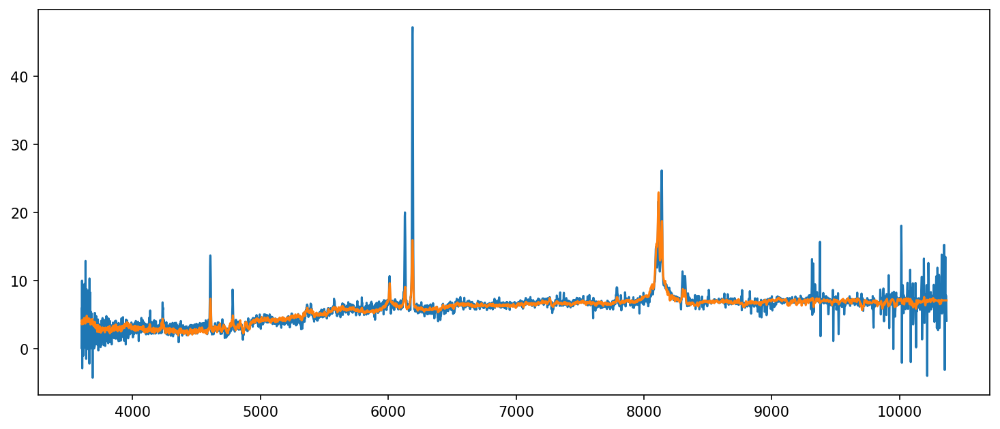

In [25]:

mjd_sdss = Time(hdul[0].header['MJD'], format='mjd')

sp1 = Table(hdul[1].data)
fig,ax=  plt.subplots(1,1, figsize=(12,5), dpi=150, facecolor='w')
ax.plot(np.power(10,sp1['LOGLAM']), sp1['FLUX'])
ax.plot(np.power(10,sp1['LOGLAM']), sp1['MODEL'])



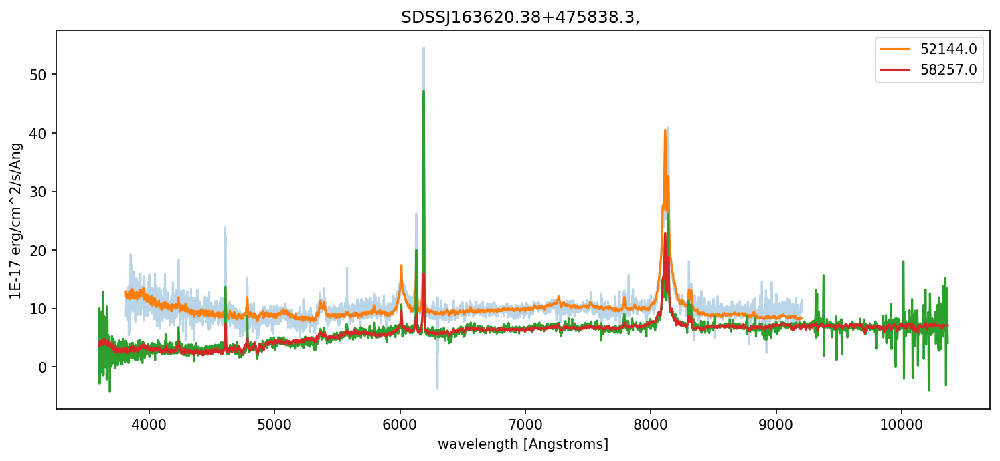

In [30]:
name ='SDSSJ163620.38+475838.3'
sp = sdss_spectra
fig,ax=  plt.subplots(1,1, figsize=(12,5), facecolor='w', dpi=150)

# first epoch 
i=0
mjd_sdss = Time(sp[i][0].header['MJD'], format='mjd')
spec = sp[i][1].data
ax.plot(np.power(10,spec['loglam']), spec['flux'], alpha=0.3)
ax.plot(np.power(10,spec['loglam']), spec['model'], label=mjd_sdss)

# second epoch 

mjd_sdss = Time(hdul[0].header['MJD'], format='mjd')
sp1 = Table(hdul[1].data)
#fig,ax=  plt.subplots(1,1, figsize=(12,5), dpi=150, facecolor='w')
ax.plot(np.power(10,sp1['LOGLAM']), sp1['FLUX'])
ax.plot(np.power(10,sp1['LOGLAM']), sp1['MODEL'], label=mjd_sdss)


ax.set_title(f'{name}, ')#mjd={mjd}',)
ax.set_xlabel('wavelength [Angstroms]')
ax.set_ylabel( sp[i][0].header['BUNIT'])
ax.legend()

ok, so now we do have both ... 

# PS1 photometry:

In [20]:
import pyvo as vo
import requests
import pylab
import json
# To allow display tweaks for wider response tables
from IPython.core.display import display
from IPython.core.display import HTML

# suppress unimportant unit warnings from many TAP services
import warnings
warnings.filterwarnings("ignore", module="astropy.io.votable.*")
warnings.filterwarnings("ignore", module="pyvo.utils.xml.elements")
TAP_service = vo.dal.TAPService("http://vao.stsci.edu/PS1DR2/tapservice.aspx")

coords = Mast.resolve_object(f'SDSS{name}')
ra,dec = coords.ra.value,coords.dec.value
radius = 1.0/3600.0 # radius = 1 arcsec

query = """
SELECT objID, RAMean, DecMean, nDetections, ng, nr, ni, nz, ny, gMeanPSFMag, 
    rMeanPSFMag, iMeanPSFMag, zMeanPSFMag, yMeanPSFMag
FROM dbo.MeanObjectView
WHERE
CONTAINS(POINT('ICRS', RAMean, DecMean),CIRCLE('ICRS',{},{},{}))=1
AND nDetections > 1
""".format(ra,dec,radius)
print(query)

job = TAP_service.run_async(query)
TAP_results = job.to_table()


/var/folders/y_/cnss5hqs3nz9dv_dd28yzt040000gq/T/ipykernel_78262/434488199.py:6: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display



SELECT objID, RAMean, DecMean, nDetections, ng, nr, ni, nz, ny, gMeanPSFMag, 
    rMeanPSFMag, iMeanPSFMag, zMeanPSFMag, yMeanPSFMag
FROM dbo.MeanObjectView
WHERE
CONTAINS(POINT('ICRS', RAMean, DecMean),CIRCLE('ICRS',249.08493,47.97734,0.0002777777777777778))=1
AND nDetections > 1



In [21]:

objid = TAP_results['objID'][0]
query = """
SELECT
    objID, detectID, Detection.filterID as filterID, Filter.filterType, obsTime, ra, dec,
    psfFlux, psfFluxErr, psfMajorFWHM, psfMinorFWHM, psfQfPerfect, 
    apFlux, apFluxErr, infoFlag, infoFlag2, infoFlag3
FROM Detection
NATURAL JOIN Filter
WHERE objID={}
ORDER BY filterID, obsTime
""".format(objid)
print(query)

job = TAP_service.run_async(query)
detection_TAP_results = job.to_table()



SELECT
    objID, detectID, Detection.filterID as filterID, Filter.filterType, obsTime, ra, dec,
    psfFlux, psfFluxErr, psfMajorFWHM, psfMinorFWHM, psfQfPerfect, 
    apFlux, apFluxErr, infoFlag, infoFlag2, infoFlag3
FROM Detection
NATURAL JOIN Filter
WHERE objID=165572490849983475
ORDER BY filterID, obsTime



In [24]:
#detection_TAP_results

In [25]:
data = detection_TAP_results
data['mag'] = -2.5*np.log10(data['psfFlux']) + 8.90
data.write(f'SDSS{name}_PS1_MAST.txt', format='csv',
              overwrite=True)

--> making an LC with `Get_QSO_summary`  : 
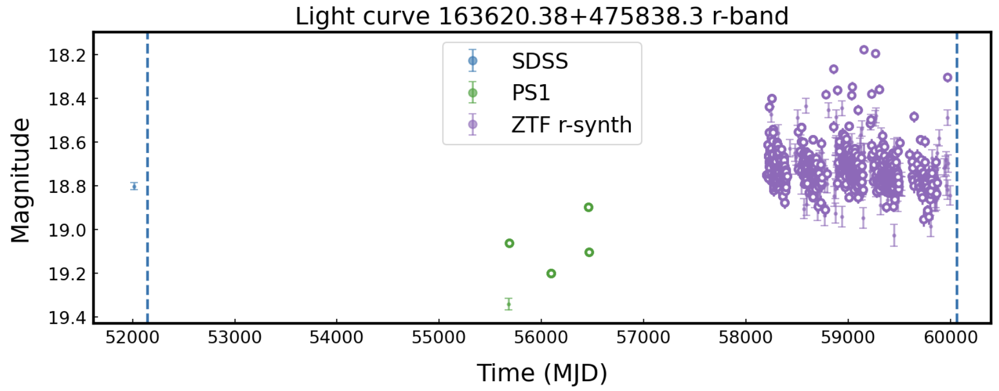

# 0. Fix all headers 

In [27]:
path = '/Users/chris/GradResearch/Q2UW06/UT230429/'
file_names = os.listdir(path)
file_paths = [os.path.join(path,fname) for fname in file_names]
kwds_dic = {'GAIN':0.6, 'DATASEC':'[1:2048, 1:4096]' , 'RDNOISE':6}

for file in file_paths:
    hdul = fits.open(file)
    for kw in kwds_dic.keys():
        if kw in dict(hdul[0].header).keys():
            continue
        else:
            print(f'{kw} is missing ')
            ofile = fits.open(file, mode='update')
            value = kwds_dic[kw]
            ofile[0].header[kw] = value
            print(f'Updated, adding {kw}:{value}')
            ofile.flush()
            ofile.close()

GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDNOISE is missing 
Updated, adding RDNOISE:6
GAIN is missing 
Updated, adding GAIN:0.6
DATASEC is missing 
Updated, adding DATASEC:[1:2048, 1:4096]
RDN

# 1. Bias 

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


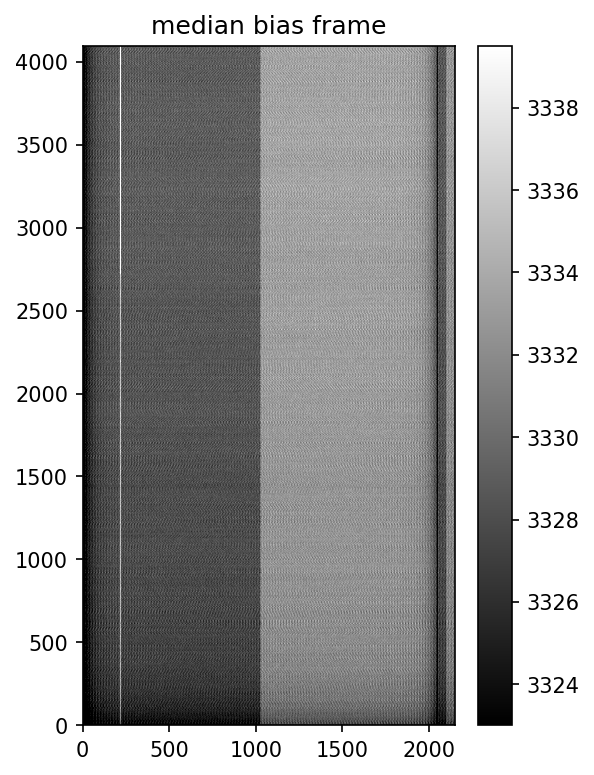

In [29]:
biasfnames = [file for file in file_names if file.startswith('bias')]
biasfiles = [os.path.join(path,fname) for fname in biasfnames]
bias = kosmos.biascombine(biasfiles)

%matplotlib inline
plt.figure(figsize=(4,6), dpi=150, facecolor='w')
plt.imshow(bias, origin='lower', aspect='auto', cmap=plt.cm.gray)
plt.title('median bias frame')
plt.clim(np.percentile(bias, (5, 98)))
cb = plt.colorbar()

# 2. Flat 

In [31]:
files = file_names
fnames =  [file for file in files if file.startswith('flat_red')]
flat_red_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('flat_blue')]
flat_blue_fpaths = [os.path.join(path,fname) for fname in fnames]

flat_red, ilum_red = kosmos.flatcombine(flat_red_fpaths,
                                       bias=bias, Saxis=1)

flat_blue, ilum_blue = kosmos.flatcombine(flat_blue_fpaths,
                                       bias=bias, Saxis=1)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


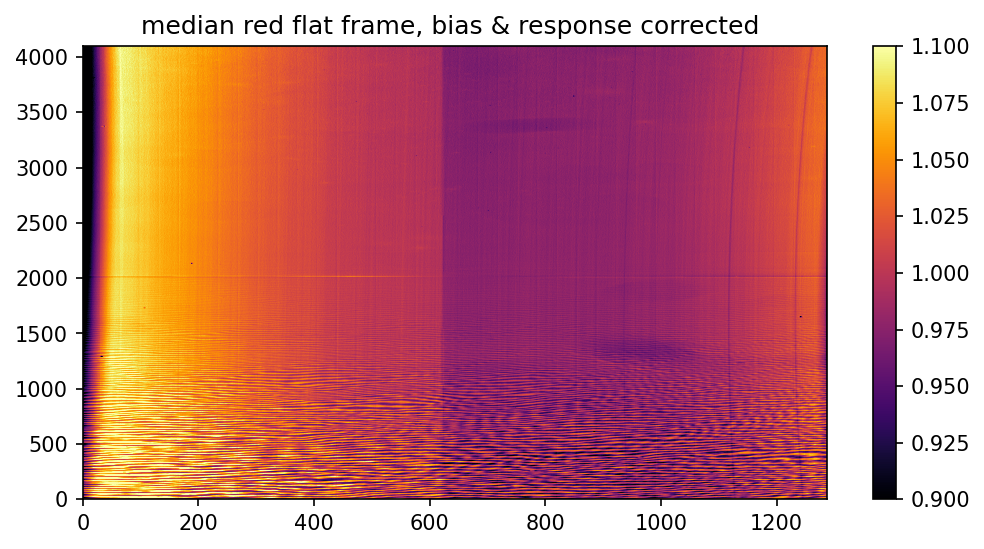

In [32]:
%matplotlib inline
fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150,  facecolor='w')
im = ax.imshow(flat_red, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median red flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


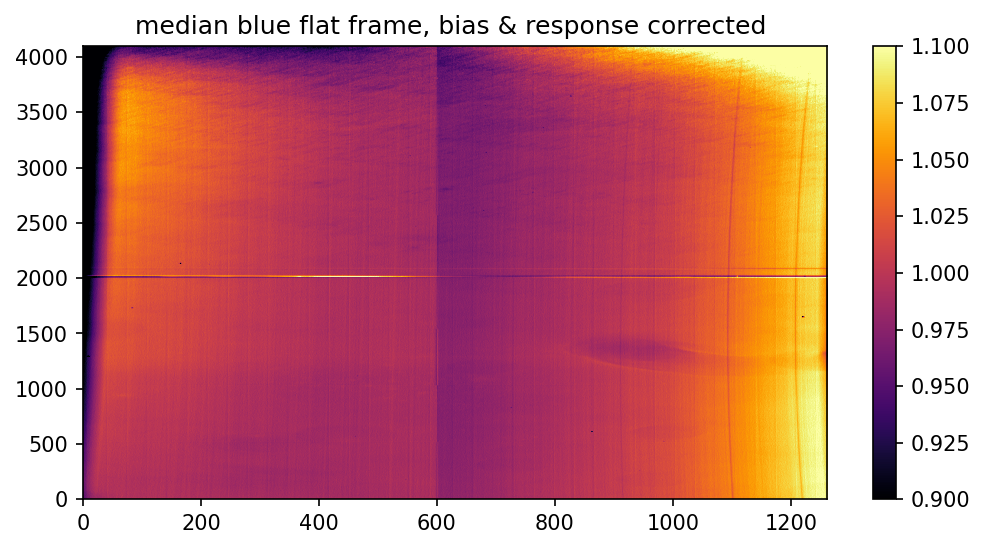

In [33]:
%matplotlib inline
fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150,  facecolor='w')
im = ax.imshow(flat_blue, origin='lower', aspect='auto', 
               cmap=plt.cm.inferno, vmin=0.9, vmax=1.1)
ax.set_title('median blue flat frame, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


# 3. 2D reduce std and qso

BD33  is the std , SDSSJ163620.38+475838.36  center blue , center red: 2 exps each 


In [36]:
fnames =  [file for file in files if file.startswith('bd33_red')]
std_red= [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('bd33_blue')]
std_blue= [os.path.join(path,fname) for fname in fnames]

In [ ]:
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()


def plot_spec_trace(hdul,fname):
    fig = plt.figure(figsize=(8, 4),dpi=150,  facecolor='w')
    left, bottom, width, height = 0,0.1,1,0.9
    ax = fig.add_axes([left,bottom,width,height])
    exp = hdul[0].header['EXPTIME']
    data = hdul[0].data
    maxcount = np.max(data)
    ax.set_title(f'{fname}, {exp} s, max {maxcount} counts')
    vmin,vmax = zscale.get_limits(data)
    ax.imshow(data,vmin=vmin, vmax=vmax, origin='lower',aspect='auto')

    # right hand side 
    ax1 = fig.add_axes([1,bottom,0.2,height], yticks=[])# sharex=True)
    line = data[:,1000]
    ax1.plot(line, np.arange(len(line)), )
    
    
    
    

In [39]:
# Just pick one of each of the exp of the first star...

std_red_2d = kosmos.proc(std_red[0], bias=bias, 
                                ilum=ilum_red, 
                            flat=flat_red, trim=True, Saxis=1)

std_blue_2d = kosmos.proc(std_blue[0], bias=bias, 
                               ilum=ilum_blue, 
                            flat=flat_blue, trim=True, Saxis=1)


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [40]:
fnames =  [file for file in files if file.startswith('J163620_red')]
qso_red = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('J163620_blue')]
qso_blue = [os.path.join(path,fname) for fname in fnames]


In [41]:
qso_red_2d = {}
qso_blue_2d = {}

for i in range(2):
    qso_red_2d[i] = kosmos.proc(qso_red[i], bias=bias, 
                                    ilum=ilum_red, flat=flat_red, trim=True,
                    Saxis=1, CR=True)
    
    qso_blue_2d[i] = kosmos.proc(qso_blue[i], bias=bias, 
                                    ilum=ilum_blue, flat=flat_blue, trim=True,
                    Saxis=1, CR=True)
 

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


INFO: overwriting Masked Objects's current mask with specified mask. [astropy.nddata.nddata]


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


INFO: overwriting Masked Objects's current mask with specified mask. [astropy.nddata.nddata]


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


INFO: overwriting Masked Objects's current mask with specified mask. [astropy.nddata.nddata]


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


INFO: overwriting Masked Objects's current mask with specified mask. [astropy.nddata.nddata]


Show what it looks like:

In [ ]:
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

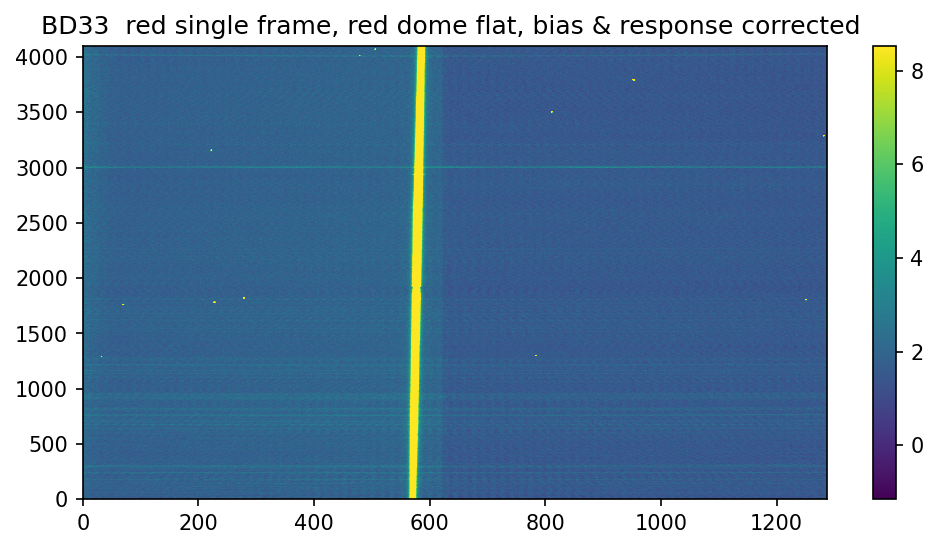

In [45]:

fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150, facecolor='w')
data = std_red_2d
vmin,vmax = zscale.get_limits(data)
im = ax.imshow(data, vmin=vmin,vmax=vmax,origin='lower', aspect='auto', )#cmap=plt.cm.inferno)#,vmin=0.9, vmax=1.1)
ax.set_title('BD33  red single frame, red dome flat, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


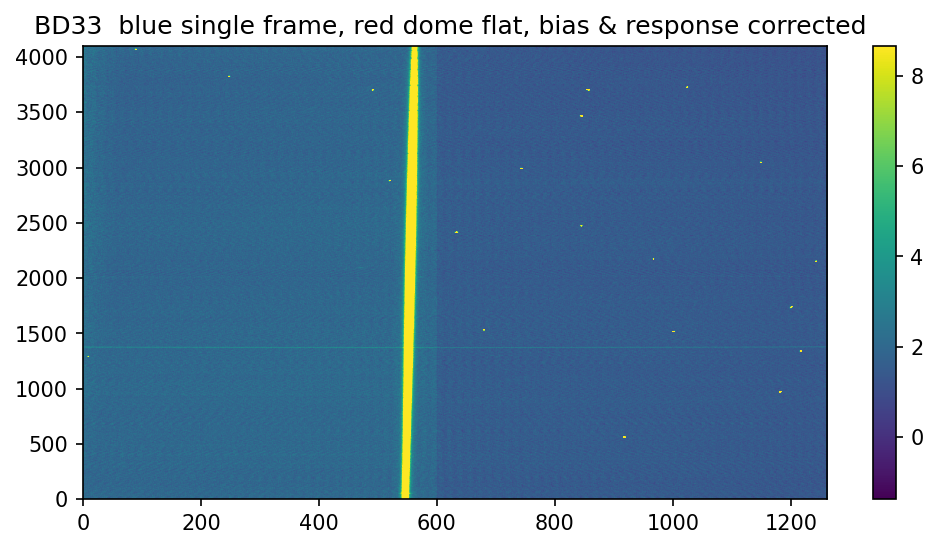

In [46]:

fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150, facecolor='w')
data = std_blue_2d
vmin,vmax = zscale.get_limits(data)
im = ax.imshow(data, vmin=vmin,vmax=vmax,origin='lower', aspect='auto', )#cmap=plt.cm.inferno)#,vmin=0.9, vmax=1.1)
ax.set_title('BD33  blue single frame, red dome flat, bias & response corrected ')
plt.colorbar(mappable=im, ax=ax)


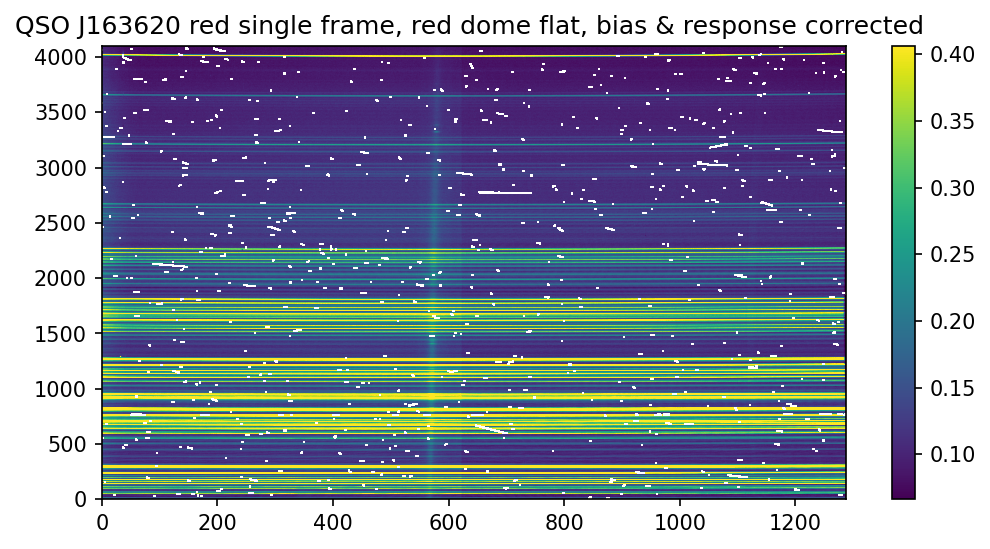

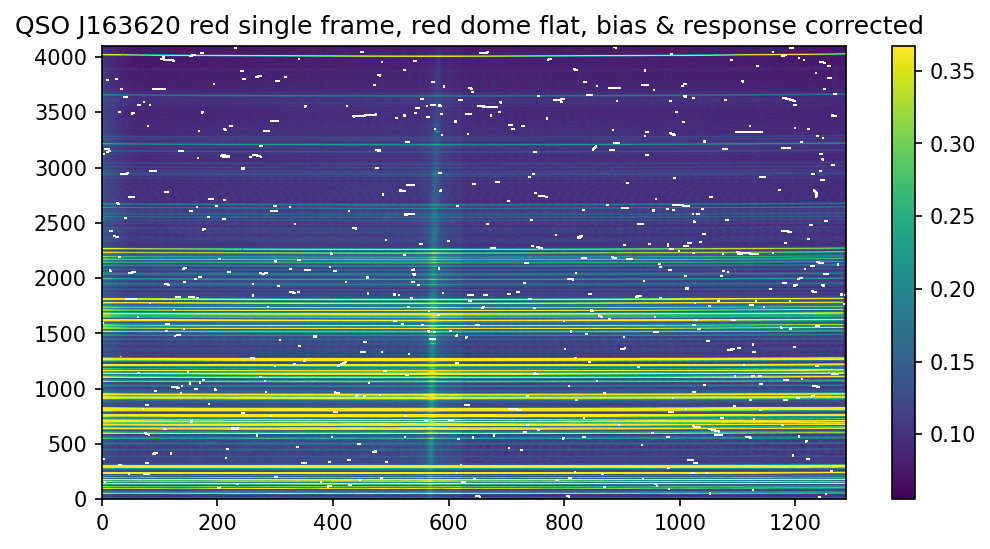

In [47]:
for i in range(2):
    fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150, facecolor='w')
    data = qso_red_2d[i]
    vmin,vmax = zscale.get_limits(data)
    im = ax.imshow(data, vmin=vmin,vmax=vmax,origin='lower', aspect='auto', )#cmap=plt.cm.inferno)#,vmin=0.9, vmax=1.1)
    ax.set_title('QSO J163620 red single frame, red dome flat, bias & response corrected ')
    plt.colorbar(mappable=im, ax=ax)


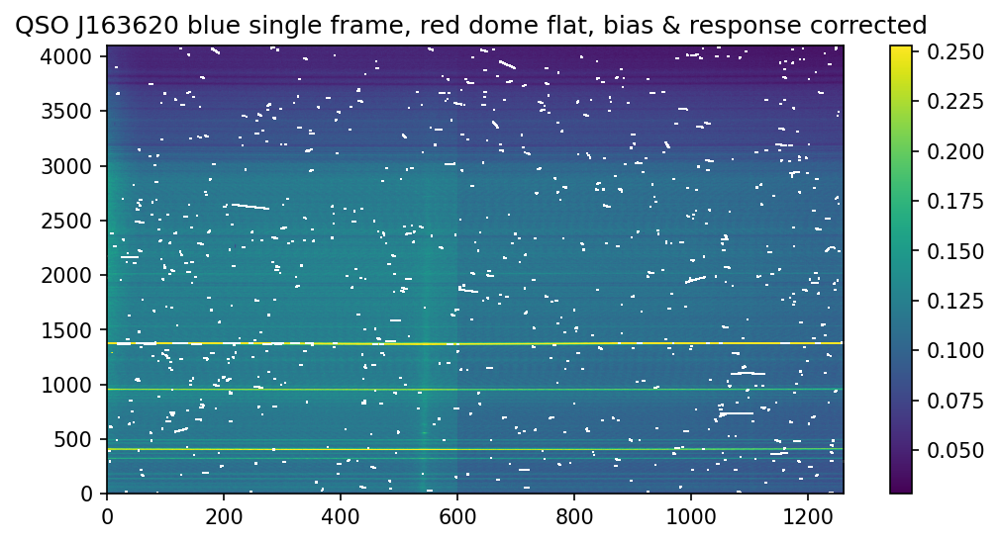

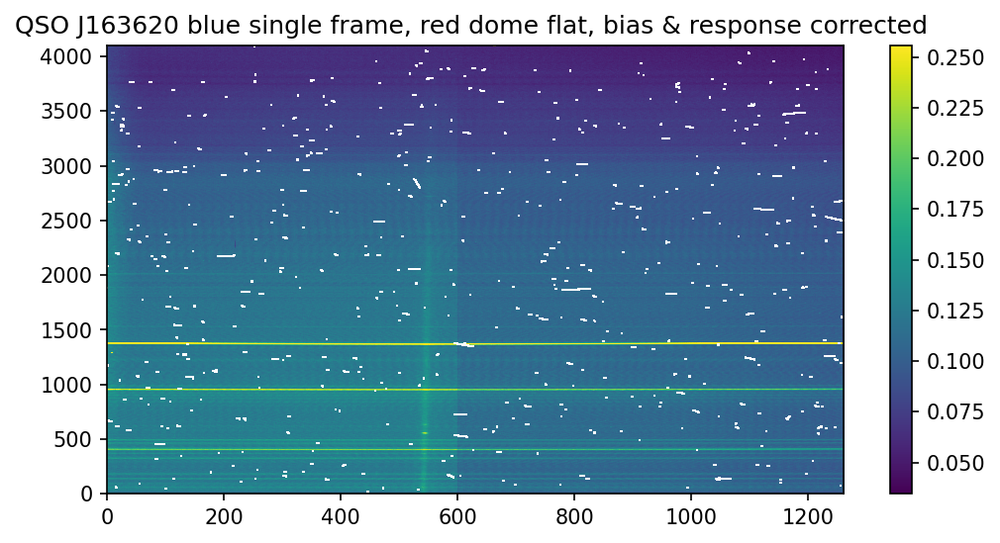

In [44]:

for i in range(2):
    fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=150, facecolor='w')
    data = qso_blue_2d[i]
    vmin,vmax = zscale.get_limits(data)
    im = ax.imshow(data, vmin=vmin,vmax=vmax,origin='lower', aspect='auto', )#cmap=plt.cm.inferno)#,vmin=0.9, vmax=1.1)
    ax.set_title('QSO J163620 blue single frame, red dome flat, bias & response corrected ')
    plt.colorbar(mappable=im, ax=ax)


# 4. 2D reduce arc lamps

(all internal this time)

* blue krypton center
* red krypton center
* blue neon center
* red neon center

In [34]:
fnames =  [file for file in files if file.startswith('blue_krypton_int')]
blue_krypton_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('red_krypton_int')]
red_krypton_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('blue_neon_int')]
blue_neon_fpaths = [os.path.join(path,fname) for fname in fnames]

fnames =  [file for file in files if file.startswith('red_neon_int')]
red_neon_fpaths = [os.path.join(path,fname) for fname in fnames]


In [35]:
red_neon_2d = {}
blue_neon_2d = {}

red_krypton_2d = {}
blue_krypton_2d = {}

for i in range(3): # 2 exposures 
    red_neon_2d[i] = kosmos.proc(red_neon_fpaths[i], bias=bias, ilum=ilum_red,
                          flat=flat_red, trim=True,
                          Saxis=1, CR=False)
    red_krypton_2d[i] = kosmos.proc(red_krypton_fpaths[i], bias=bias, ilum=ilum_red,
                          flat=flat_red, trim=True,
                          Saxis=1, CR=False)
    
    blue_neon_2d[i] = kosmos.proc(blue_neon_fpaths[i], bias=bias, ilum=ilum_blue,
                          flat=flat_blue, trim=True,
                          Saxis=1, CR=False)
    blue_krypton_2d[i] = kosmos.proc(blue_krypton_fpaths[i], bias=bias, ilum=ilum_blue,
                          flat=flat_blue, trim=True,
                          Saxis=1, CR=False)
    
   

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


# 5. Extract 1d spectra: std, qso, arcs 

As usual - start from extracting the standard star. Then use those for the QSO and arc. 

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


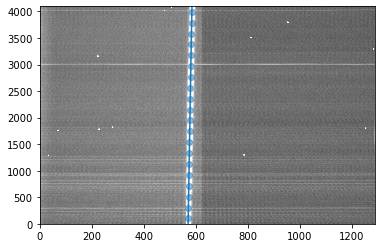

In [49]:
fig, ax = plt.subplots(1,1)
std_red_trace = kosmos.trace(std_red_2d, display=True, ax=ax, Saxis=1,
                             guess=580, window=50)

/Users/chris/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:755: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


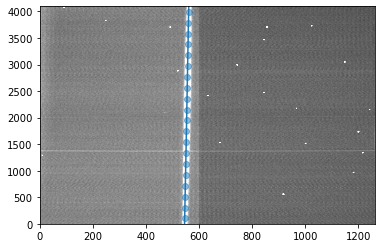

In [50]:
fig, ax = plt.subplots(1,1)
std_blue_trace = kosmos.trace(std_blue_2d, display=True, ax=ax, Saxis=1,
                             guess=580, window=50)

Use these to extract the star:

In [164]:

std_red_1d, std_red_sky = kosmos.BoxcarExtract(std_red_2d, std_red_trace, 
                                                   display=True, ax=ax, 
                                                  Saxis=1,apwidth=15)

std_blue_1d, std_blue_sky = kosmos.BoxcarExtract(std_blue_2d, std_blue_trace, 
                                               display=True, ax=ax, 
                                              Saxis=1,apwidth=15)


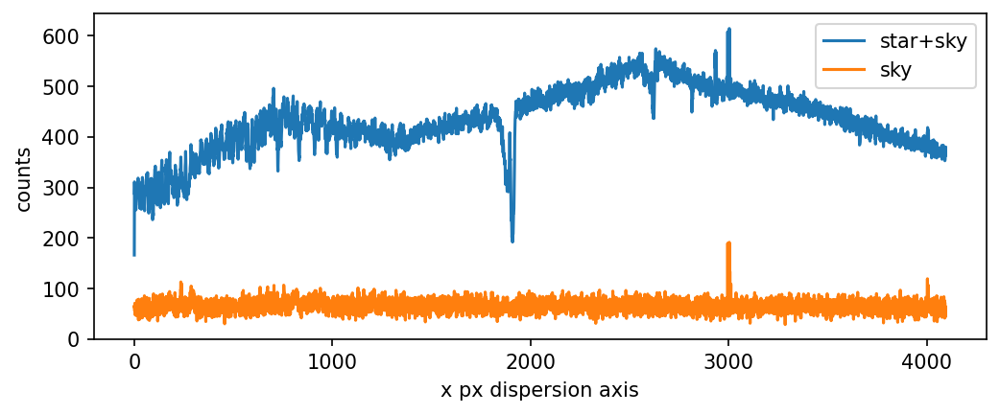

In [170]:
fig,ax = plt.subplots(1,1, figsize=(8,3), facecolor='w',  dpi=150)
ax.plot(std_red_1d.spectral_axis, std_red_1d.flux, label='star+sky')
ax.plot(std_red_sky.spectral_axis, std_red_sky.flux , label='sky')
ax.set_xlabel('x px dispersion axis')
ax.set_ylabel('counts')
ax.legend()

Test if the trace works as-is for the QSO:

zscale vmin,vmax:0.06605009762882598,0.40600162136011964


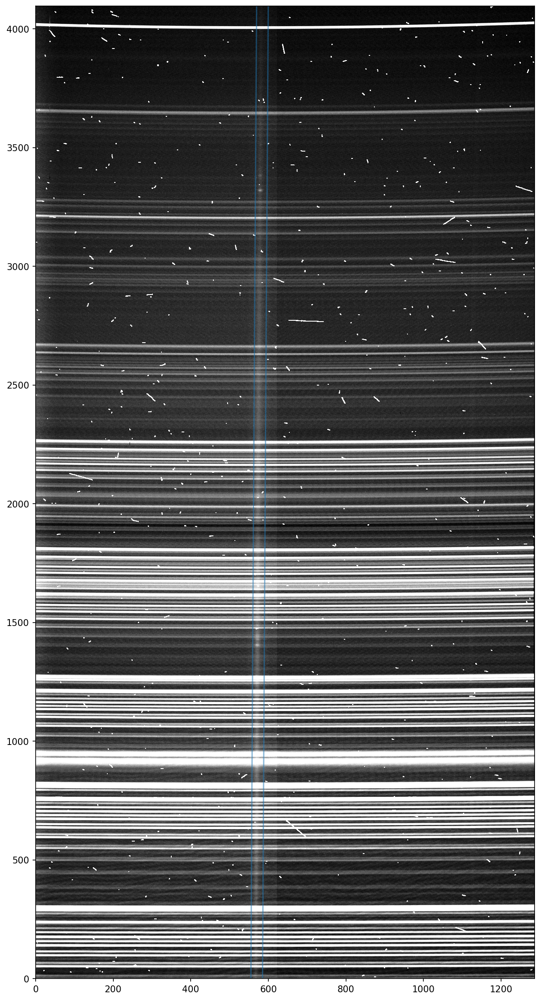

In [52]:
def plot_image_trace(img, trace_line, apwidth=15, use_zscale=True, vmin=0, vmax=0.3):
    fig,ax = plt.subplots(1,1, figsize=(10,20), dpi=150)
    zscale = ZScaleInterval()
    if use_zscale:
        vmin, vmax=  zscale.get_limits(img)
        print(f'zscale vmin,vmax:{vmin},{vmax}')
    im = ax.imshow(img, vmin=vmin, vmax=vmax, origin='lower', aspect='auto', cmap=plt.cm.Greys_r)
    #im.set_clim(np.percentile(img, (5, 98)))
    #ax.plot(trace_line, np.arange(len(trace_line)), c='C0')
    ax.plot(trace_line + apwidth, np.arange(len(trace_line)), c='C0', alpha=0.5)
    ax.plot(trace_line - apwidth, np.arange(len(trace_line)), c='C0', alpha=0.5)
    
    
plot_image_trace(qso_red_2d[0], std_red_trace)#+5)

It does! How about the blue end:

zscale vmin,vmax:0.034504201739934105,0.2554565770351087


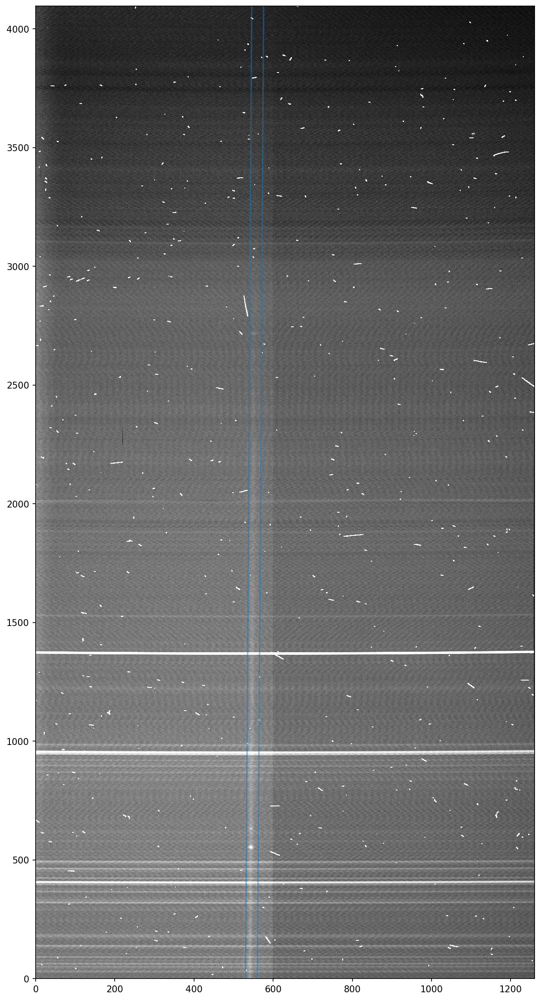

In [54]:
plot_image_trace(qso_blue_2d[1], std_blue_trace)

ok, that works too. Use these to extract the 1d spec:

In [158]:
kosmos.BoxcarExtract??

In [55]:
qso_red_1d = {}
qso_red_sky = {}
qso_blue_1d = {}
qso_blue_sky = {}
for i in range(2):
    qso_red_1d[i], qso_red_sky[i] = kosmos.BoxcarExtract(qso_red_2d[i], std_red_trace, 
                                                   display=True, ax=ax, 
                                                  Saxis=1,apwidth=15)
    qso_blue_1d[i], qso_blue_sky[i] = kosmos.BoxcarExtract(qso_blue_2d[i], std_blue_trace, 
                                                   display=True, ax=ax, 
                                                  Saxis=1,apwidth=15)

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +
/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +
/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +
/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


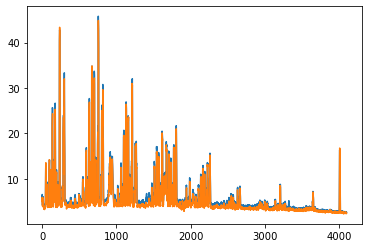

In [162]:
plt.plot(qso_red_1d[i].spectral_axis, qso_red_1d[i].flux)
plt.plot(qso_red_sky[i].spectral_axis, qso_red_sky[i].flux)

Extract arcs:

In [60]:
#plot_image_trace(red_neon_2d[2], std_red_trace) 

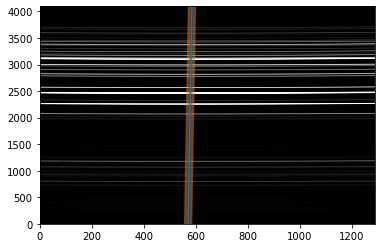

/Users/chris/GradResearch/kosmos/kosmos/apextract.py:335: RuntimeWarning: invalid value encountered in sqrt
  fluxerr[i] = np.sqrt(np.nansum((onedspec[i]-skysubflux[i])) +


In [61]:
fig, ax = plt.subplots(1,1)

# NB   I use the same tool as is usually used to extract the object
# object_spec_1d , sky_spec_1d,
# but for arc lamps there is no sky, so I just leave "_" since I won't
# use it for anything.

#argon: 1 exp
red_neon_1d , _  = kosmos.BoxcarExtract(red_neon_2d[0], std_red_trace, display=True, 
                                                 ax=ax, Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)
    
red_krypton_1d , _  = kosmos.BoxcarExtract(red_krypton_2d[0], std_red_trace, display=True, 
                                                 ax=ax, Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)

blue_neon_1d , _  = kosmos.BoxcarExtract(blue_neon_2d[0], std_blue_trace, display=True, 
                                                 ax=ax, Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)
blue_krypton_1d , _  = kosmos.BoxcarExtract(blue_krypton_2d[0], std_blue_trace, display=True, 
                                                 ax=ax, Saxis=1,
                                                 apwidth=3, skysep=5, skywidth=5)



# 6. Wavelength calibration

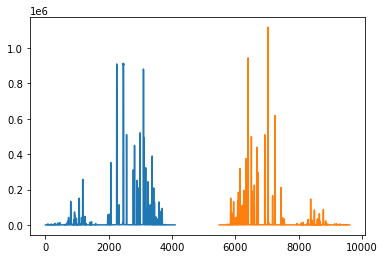

In [130]:
# external 
ref = Table.read('red_center_neon_1d_wave_230319.txt', format='ascii')

# internal 
#ref = Table.read('red_low_neon_1d_wave_230427.txt', format='ascii')

# external 
#ref = Table.read('red_low_Neon_1d_wave.txt', format='ascii')
# Best to use internal also, b/c then flux levels match 
plt.plot(red_neon_1d.spectral_axis, red_neon_1d.flux)
plt.plot(ref['wave'], ref['flux']*75)

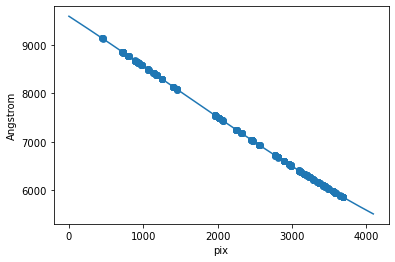

In [131]:
from specutils import Spectrum1D
red_ref = ref
red_ref_1d = Spectrum1D(spectral_axis=red_ref['wave'].data * u.angstrom,
                        flux=red_ref['flux'].data * u.adu*75)

xrc, wrc = kosmos.identify_dtw(red_neon_1d, red_ref_1d , upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=True, peak_spline=True, pthreshold=0.9)



This looks straight, so use it as is 

Now for the blue end:

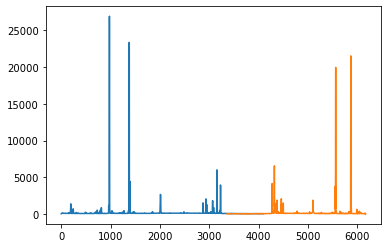

In [92]:
ref = Table.read('blue_low_krypton_1d_wave_230319.txt', format='ascii')
plt.plot(blue_krypton_1d.spectral_axis, blue_krypton_1d.flux)
plt.plot(ref['wave'], ref['flux'])

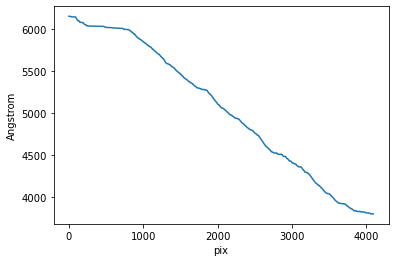

In [94]:
blue_ref = ref
blue_ref_1d = Spectrum1D(spectral_axis=blue_ref['wave'].data * u.angstrom,
                        flux=blue_ref['flux'].data * u.adu)

xbl, wbl = kosmos.identify_dtw(blue_krypton_1d, blue_ref_1d , upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=True, peak_spline=True, pthreshold=0.9)



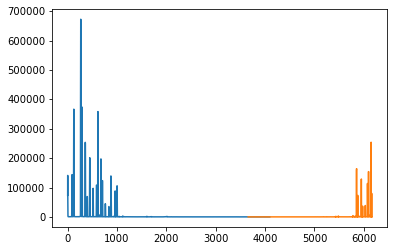

In [111]:
ref = Table.read('blue_low_neon_1d_wave.txt', format='ascii')
plt.plot(blue_neon_1d.spectral_axis, blue_neon_1d.flux)
plt.plot(ref['wave'], ref['flux']*75)


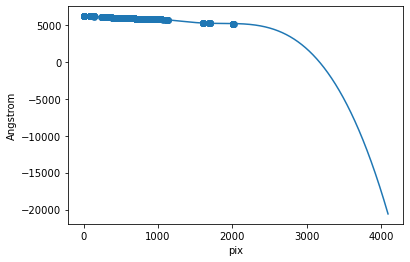

In [112]:
blue_ref = ref
blue_ref_1d = Spectrum1D(spectral_axis=blue_ref['wave'].data * u.angstrom,
                        flux=blue_ref['flux'].data * u.adu)

xbl, wbl = kosmos.identify_dtw(blue_neon_1d, blue_ref_1d , upsample=False, 
                            open_begin=True, open_end=True, step_pattern='asymmetric',
                            display=True, peak_spline=True, pthreshold=0.9)



In [103]:
path_to_arcs = os.path.join(kosmos.__path__[0],'resources/linelists/')
os.listdir(path_to_arcs)

['ctiohear.dat',
 'krypton.dat',
 'ohlines.dat',
 'vacthar.dat',
 'argon.dat',
 'thar.dat',
 'vacidhenear.dat',
 'README',
 'apohenear.dat',
 'idhenear.dat',
 'lowskylines.dat',
 'ctiohenear.dat',
 'xenon.dat',
 'idhenearT.dat',
 'fear.dat',
 'skylines.dat',
 'henearhres.dat',
 'cuar.dat',
 'henear.dat']

In [113]:
# The old IRAF-style linelists just have 2 col: (wavelength, line name)
#tbl = Table.read(f'{path_to_arcs}/krypton.dat', 
#                        names=('wave', 'name'), format='ascii')

tbl = Table.read(f'{path_to_arcs}/apohenear.dat',names=('wave', 'name'), format='ascii')

In [119]:
linewave.data

array([3888.65, 4198.32, 4471.48, 4713.15, 4921.93, 5015.68, 5875.62,
       6074.34, 6096.16, 6143.06, 6163.59, 6217.28, 6266.5 , 6304.79,
       6334.43, 6382.99, 6402.25, 6506.53, 6532.88, 6598.95, 6678.15,
       6717.04, 6929.47, 6965.43, 7032.41, 7065.19, 7245.17, 7383.98,
       7438.9 , 7635.11, 8115.31, 8377.61, 8424.65, 9122.97, 9657.78])

In [122]:
wbl

<Quantity [6163.27209943, 6163.97766725, 6164.65905675, 6165.31652201,
           6165.95031713, 6166.56069618, 6167.14791327, 6167.71222248,
           6168.25387789, 6168.7731336 , 6163.33452352, 6162.90129663,
           6162.46472668, 6162.02506774, 6161.58257391, 6161.13749928,
           6160.69009794, 6160.24062397, 6159.78933146, 6159.3364745 ,
           6158.88230718, 6158.42708358, 6157.97105781, 6157.51448394,
           6157.05761606, 6156.60070826, 6156.14401463, 6149.07337991,
           6148.65920271, 6148.24981327, 6147.84546568, 6147.44641404,
           6147.05291242, 6146.66521491, 6146.28357561, 6145.90824861,
           6145.53948798, 6145.17754783, 6144.82268224, 6144.47514529,
           6144.13519108, 6143.80307369, 6143.47904722, 6143.16336574,
           6142.85628336, 6142.55805415, 6142.26893222, 6141.98917163,
           6141.71902649, 6141.45875088, 6141.2085989 , 6140.96882462,
           6140.73968213, 6140.31356341, 6123.23586511, 6120.59351926,
      

In [123]:
# IMPROVEMENT NEEDED: need to make `identify_nearest` point to these linelists itself?
tbl['wave'].unit = u.angstrom
linewave = tbl['wave']

#kosmos.identify_nearest(blue_neon_1d, wapprox=wbl, linewave=linewave.data)

Need to click one by one - none of the stored spec seen


    Instructions:
    ------------
    0) For proper interactive widgets, ensure you're using the Notebook backend
    in the Jupyter notebook, e.g.:
        %matplotlib notebook
    1) Click on arc-line features (peaks) in the plot. The Pixel Value box should update.
    2) Enter the known wavelength of the feature in the Wavelength box.
    3) Click the Assign button, a red line will be drawn marking the feature.
    4) When you've identified all your lines, stop the interaction for (or close) the figure.


<IPython.core.display.Javascript object>


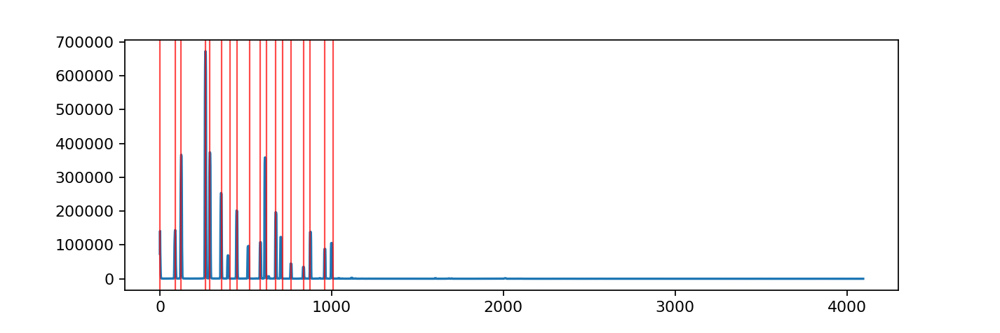

[1.073068624790779] [6598.9]
[1.073068624790779, 88.37363400495155] [6598.9, 6532.88]
[1.073068624790779, 88.37363400495155, 124.19279413734388] [6598.9, 6532.88, 6506.0]
[1.073068624790779, 88.37363400495155, 124.19279413734388, 266.7275488941649] [6598.9, 6532.88, 6506.0, 6402.4]
[1.073068624790779, 88.37363400495155, 124.19279413734388, 266.7275488941649, 291.100142084972] [6598.9, 6532.88, 6506.0, 6402.4, 6383.0]
[1.073068624790779, 88.37363400495155, 124.19279413734388, 266.7275488941649, 291.100142084972, 357.3583596481724] [6598.9, 6532.88, 6506.0, 6402.4, 6383.0, 6334.0]
[1.073068624790779, 88.37363400495155, 124.19279413734388, 266.7275488941649, 291.100142084972, 357.3583596481724, 406.8446260218212] [6598.9, 6532.88, 6506.0, 6402.4, 6383.0, 6334.0, 6305.0]
[1.073068624790779, 88.37363400495155, 124.19279413734388, 266.7275488941649, 291.100142084972, 357.3583596481724, 406.8446260218212, 447.8338709915269] [6598.9, 6532.88, 6506.0, 6402.4, 6383.0, 6334.0, 6305.0, 6266.0]
[1.

In [124]:
%matplotlib notebook
xpxl_arc_blue, wpts_arc_blue = kosmos.identify_widget(blue_neon_1d)

In [125]:
#Save those so I don't have to do it again;
fname =  os.path.join(path, 'blue_neon_xpx_wpts_int_center.txt')
X = [np.array(wpts_arc_blue), xpxl_arc_blue]
np.savetxt(fname, X)


<IPython.core.display.Javascript object>


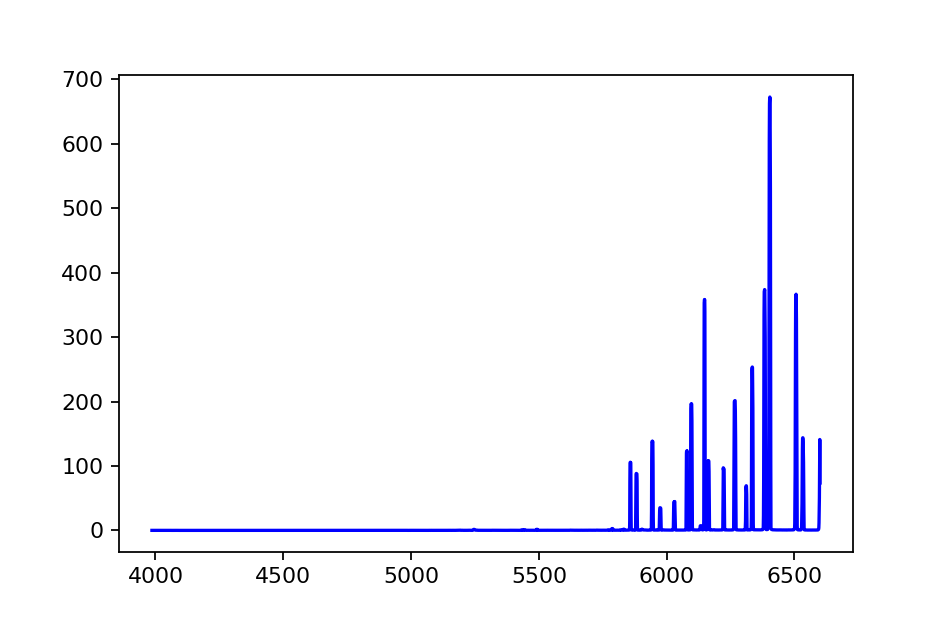

In [126]:
wpts_arc_blue = np.array(wpts_arc_blue)*u.angstrom
xpxl_arc_blue = np.array(xpxl_arc_blue)

fit_wavelength_args={'mode':'interp', 'deg':1}
blue_neon_1d_wave = kosmos.fit_wavelength(blue_neon_1d, 
                                         xpxl_arc_blue, wpts_arc_blue, 
                                         **fit_wavelength_args
                                        )
# store the wavelength-calibrated arc lamp spectrum 
t = Table(data=[np.array(blue_neon_1d_wave.wavelength), 
                np.array(blue_neon_1d_wave.flux)],
          names=['wave','flux'])
t.write('blue_center_neon_1d_wave_int.txt', 
         format='ascii', overwrite=True)

# plot what it looks like 
plt.plot(blue_neon_1d_wave.spectral_axis, blue_neon_1d_wave.flux/1e3, c='blue')

Apply and store the lamp spectra: 

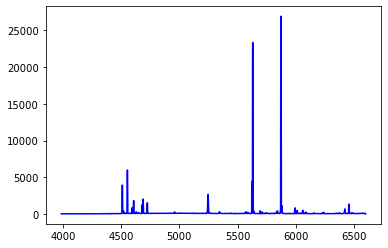

In [128]:
%matplotlib inline

fit_wavelength_args={'mode':'interp', 'deg':1}
blue_krypton_1d_wave = kosmos.fit_wavelength(blue_krypton_1d, 
                                         xpxl_arc_blue, wpts_arc_blue, 
                                         **fit_wavelength_args
                                        )
# store the wavelength-calibrated arc lamp spectrum 
t = Table(data=[np.array(blue_krypton_1d_wave.wavelength), np.array(blue_krypton_1d_wave.flux)],
          names=['wave','flux'])
t.write('blue_center_krypton_1d_wave.txt', 
         format='ascii', overwrite=True)

# plot what it looks like 
plt.plot(blue_krypton_1d_wave.spectral_axis, blue_krypton_1d_wave.flux, c='blue')

In [133]:
xbc = xpxl_arc_blue

In [134]:
wbc = wpts_arc_blue


# 7. Apply wavelength solution 

In [135]:
import specutils
# signature of calibrate_wavelengths is (xpts, wpts, obj_spectrum, sky_spectrum...)

def apply_wavelength_solution(obj_spectrum, xpts=None, wpts=None, 
                              sky_spectrum=None,  
                              fit_wavelength_args={'mode':'interp',
                              'deg':1}):
    
    ''' This is needed to apply a wavelength solution (xpts, wpts) mapping,
    i.e. what wavelength  each x-pixel position along the spectral axis 
    corresponds to. These points are used to fit a simple eg. linear
    function that maps x-position to wavelength. 
    
    obj_spectrum: specutils.spectra.spectrum1d.Spectrum1D, 
        a 1D spectrum (i.e. after extraction of the spectrum 
        along  a trace from an original FITS image, which 
        is a 2D spectrum). 
        If the  obj_spectrum corresponds to a sky observation, 
        it will contain sky lines contamination (eg. science object,
        standard star). In that case, sky_spectrum should also be 
        provided to create a sky-subtracted spectrum.
        However, uf obj_spectrum corresponds to a calibration,
        eg. external or internal calibration arc lamps, 
        then there is no need to subtract sky background emission
        (since there isn't any). 
    xpts:  numpy.ndarray  of x-positions along spectral axis 
    wpts:  numpy.ndarray of wavelength (in Angstroms) along spectral axis 
    sky_spectrum: specutils.spectra.spectrum1d.Spectrum1D (optional)
       a 1D spectrum (as above), usually from running 
       obj_spectrum, sky_spectrum = kosmos.BoxcarExtract(obj_2D_spectrum, 
                                       obj_trace, **kwargs)
    mode: str, mode used by kosmos.fit_wavelength() ('interp' or 'gp') 
    deg : int,  degree of polynomial (default is 1) options 
         passed to   kosmos.fit_wavelength()             
    
    '''
    # xpts = xpxl_int_arc_red
    # wpts = wpts_int_arc_red
    # obj_spectrum = red_neon_1d
    # sky_spectrum = red_neon_sky

    #Create sky subtracted spectrum
    if sky_spectrum is not None:
        obj_flux = obj_spectrum.flux-sky_spectrum.flux
    else:
        obj_flux = obj_spectrum.flux
    sky_sub_obj_spectrum = specutils.Spectrum1D(flux=obj_flux, 
                                                spectral_axis=obj_spectrum.spectral_axis, 
                                    uncertainty=obj_spectrum.uncertainty)

    #Apply the wavelength solution to the sky subtracted spectrum
    obj_wave = kosmos.fit_wavelength(sky_sub_obj_spectrum, 
                                            xpts, wpts, **fit_wavelength_args)
    #mode='interp', deg=deg)
    return obj_wave

In [157]:
kosmos.fit_wavelength?

Text(0.5, 1.0, 'Wavelength Calibrated Spectrum BD33 (Red+Blue)')

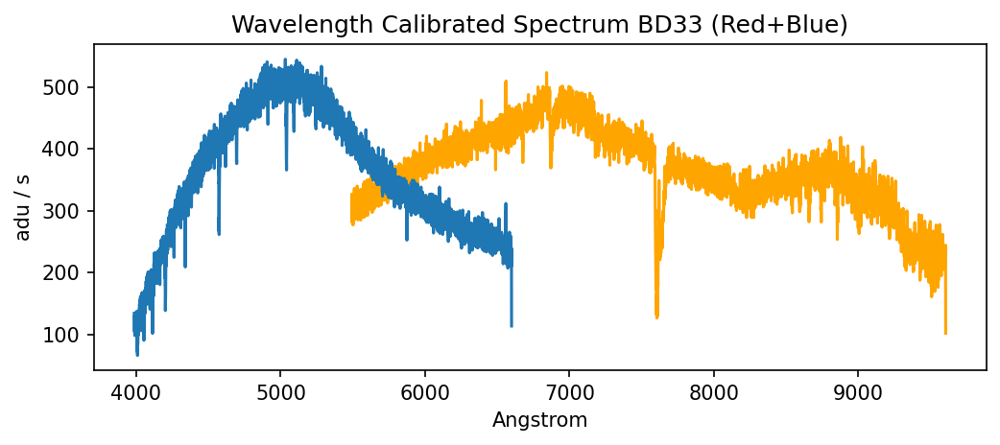

In [136]:

fit_wavelength_args={'mode':'interp', 'deg':1}
std_red_1d_wave = apply_wavelength_solution(std_red_1d,  
                                xrc, wrc,
                                std_red_sky,  
                                 fit_wavelength_args
                                )

std_blue_1d_wave  = apply_wavelength_solution(std_blue_1d,  
                                xbc, wbc,
                                std_blue_sky,  
                                fit_wavelength_args
                                )

%matplotlib inline
fig,ax = plt.subplots(1,1, figsize=(8,3), facecolor='w',  dpi=150)
ax.plot(std_red_1d_wave.spectral_axis, 
        std_red_1d_wave.flux, c='orange')
ax.plot(std_blue_1d_wave.spectral_axis, 
       std_blue_1d_wave.flux)
ax.set_xlabel(std_red_1d_wave.spectral_axis.unit)
ax.set_ylabel(std_red_1d_wave.flux.unit)
ax.set_title('Wavelength Calibrated Spectrum BD33 (Red+Blue)')



Text(0.5, 1.0, 'Wavelength Calibrated Spectrum QSO J163620 (Red)')

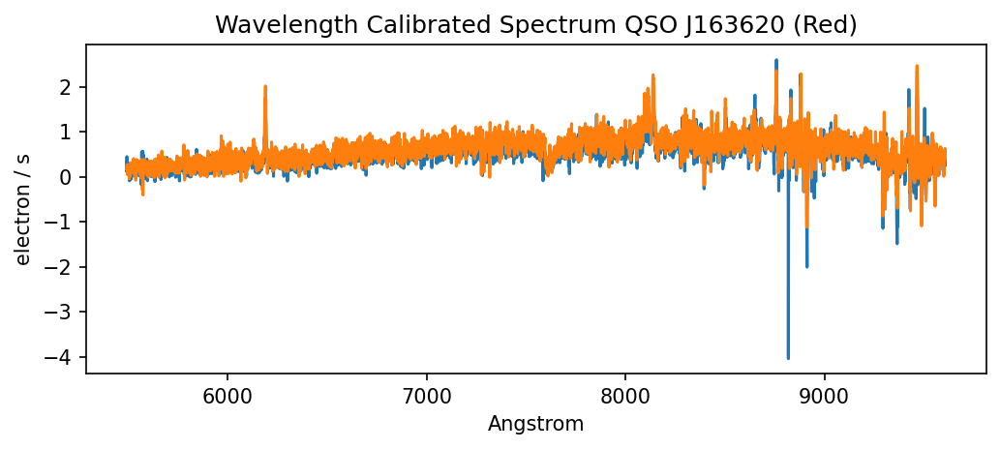

In [137]:
qso_red_1d_wave = {} 
qso_blue_1d_wave = {} 
for i in range(2):
    # two red & blue exposures 
    qso_red_1d_wave[i] = apply_wavelength_solution(qso_red_1d[i],  
                                xrc, wrc,
                                qso_red_sky[i],  
                                fit_wavelength_args
                                )
    qso_blue_1d_wave[i] = apply_wavelength_solution(qso_blue_1d[i],  
                                xbc, wbc,
                                qso_blue_sky[i],  
                                fit_wavelength_args
                                )
    


%matplotlib inline
fig,ax = plt.subplots(1,1, figsize=(8,3), facecolor='w',  dpi=150)
for i in range(2):
    ax.plot(qso_red_1d_wave[i].spectral_axis, 
            qso_red_1d_wave[i].flux, )#c='orange')
ax.set_xlabel(qso_red_1d_wave[0].spectral_axis.unit)
ax.set_ylabel(qso_red_1d_wave[0].flux.unit)
ax.set_title('Wavelength Calibrated Spectrum QSO J163620 (Red)')


Text(0.5, 1.0, 'Wavelength Calibrated Spectrum QSO J163620 (Blue)')

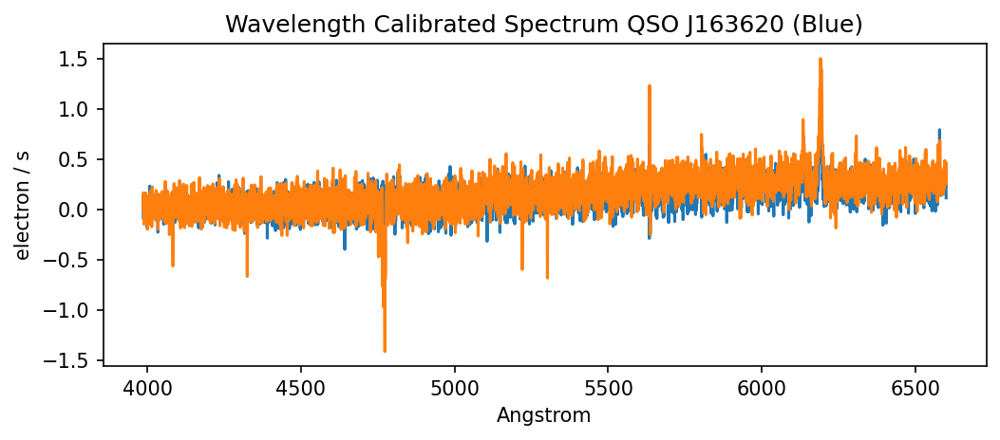

In [139]:
fig,ax = plt.subplots(1,1, figsize=(8,3), facecolor='w',  dpi=150)
for i in range(2):
    ax.plot(qso_blue_1d_wave[i].spectral_axis, 
            qso_blue_1d_wave[i].flux, )#c='orange')
ax.set_xlabel(qso_red_1d_wave[0].spectral_axis.unit)
ax.set_ylabel(qso_red_1d_wave[0].flux.unit)
ax.set_title('Wavelength Calibrated Spectrum QSO J163620 (Blue)')

# 8. Airmass correction

In [172]:
kosmos.airmass_cor??

In [140]:
Xfile = kosmos.obs_extinction('apoextinct.dat')

# only red has two exps,  blue has one ... 
qso_red_1d_amcorr = {}
qso_blue_1d_amcorr = {}



std_red_1d_amcorr = kosmos.airmass_cor(std_red_1d_wave, 
                                       std_red_2d.header['AIRMASS'],
                                       Xfile)
std_blue_1d_amcorr = kosmos.airmass_cor(std_blue_1d_wave, 
                                        std_blue_2d.header['AIRMASS'],
                                        Xfile)


for i in range(2):
    qso_red_1d_amcorr[i] = kosmos.airmass_cor(qso_red_1d_wave[i], 
                                          qso_red_2d[i].header['AIRMASS'],
                                          Xfile)
    qso_blue_1d_amcorr[i] = kosmos.airmass_cor(qso_blue_1d_wave[i], 
                                          qso_blue_2d[i].header['AIRMASS'],
                                          Xfile)
  

# 9. Flux calibration

Check for stellar spectrum of https://www.eso.org/sci/observing/tools/standards/spectra/bd33d2642.html 

In [143]:
kosmos_path = os.path.split(kosmos.__file__)[:-1][0]
path_to_stds = os.path.join(kosmos_path, 'resources','onedstds')
dirs = next(os.walk(path_to_stds))[1]
for d in dirs:
    stars = os.listdir(os.path.join(path_to_stds, d))
    for star in stars :
        if ('bd33' in star) :
            print(d, star)
       

irscal bd332642.dat
iidscal bd332642.dat


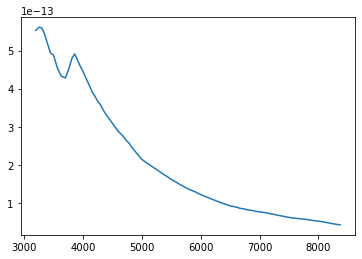

In [146]:
std = kosmos.onedstd('irscal/bd332642.dat')
plt.plot(std['wave'], std['flux'])

Text(0, 0.5, 'sensfunc')

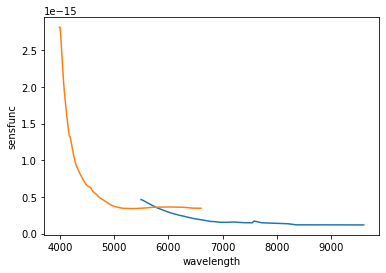

In [147]:
sens_func_red = kosmos.standard_sensfunc(std_red_1d_amcorr, 
                                             std, mode='linear')
sens_func_blue = kosmos.standard_sensfunc(std_blue_1d_amcorr, 
                                              std, mode='linear')

plt.plot(sens_func_red.spectral_axis, sens_func_red.flux)
plt.plot(sens_func_blue.spectral_axis, sens_func_blue.flux)

plt.xlabel('wavelength')
plt.ylabel('sensfunc')

In [148]:
std_red_1d_fluxcal = kosmos.apply_sensfunc(std_red_1d_amcorr, sens_func_red, )
std_blue_1d_fluxcal = kosmos.apply_sensfunc(std_blue_1d_amcorr, sens_func_blue, )


In [149]:
qso_red_1d_fluxcal = {}
qso_blue_1d_fluxcal = {}

for i in range(2):
    qso_red_1d_fluxcal[i] = kosmos.apply_sensfunc(qso_red_1d_amcorr[i], sens_func_red, )
    qso_blue_1d_fluxcal[i] = kosmos.apply_sensfunc(qso_blue_1d_amcorr[i], sens_func_blue, )

Text(0.5, 1.0, 'Flux Calibrated Spectrum BD+33 2642  red')

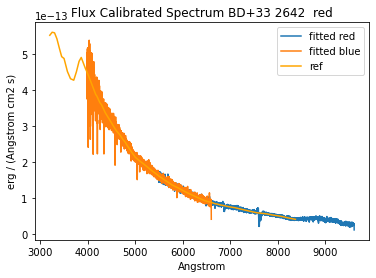

In [151]:
fig, ax = plt.subplots(1,1)

ax.plot(std_red_1d_fluxcal.spectral_axis.value, std_red_1d_fluxcal.flux.value,
       label='fitted red ')
ax.plot(std_blue_1d_fluxcal.spectral_axis.value, std_blue_1d_fluxcal.flux.value,
       label='fitted blue')

# plotting the reference spectrum... 
ax.plot(std['wave'], std['flux'], c='orange', label='ref')
ax.legend()
ax.set_xlabel(std_red_1d_fluxcal.spectral_axis.unit)
ax.set_ylabel(std_red_1d_fluxcal.flux.unit)
ax.set_title('Flux Calibrated Spectrum BD+33 2642  red')  

(0.0, 1e-15)

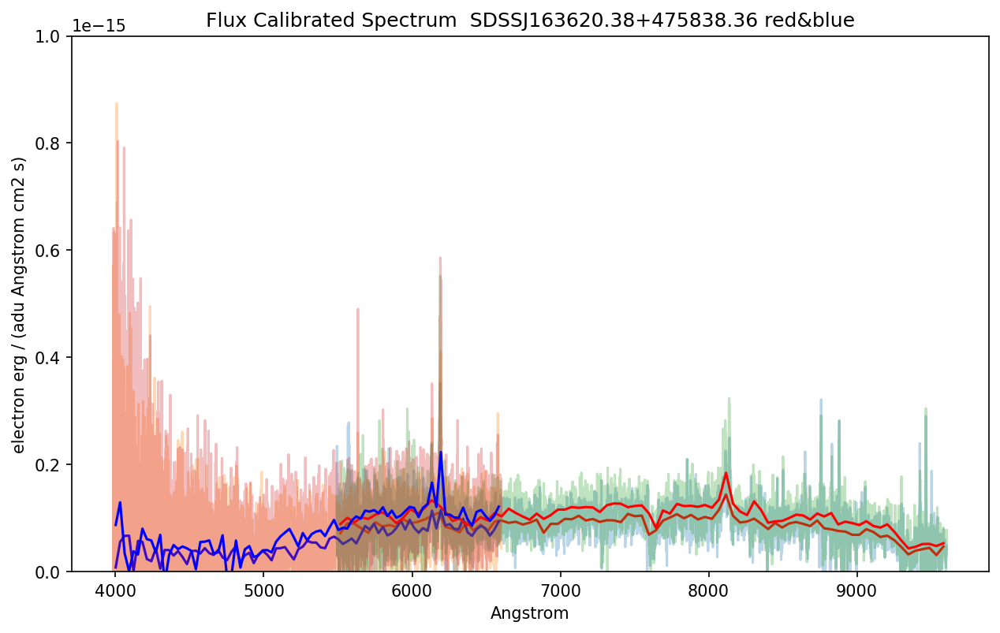

In [153]:
from scipy.stats import binned_statistic
fig, ax = plt.subplots(1,1, figsize=(10,6), dpi=150, facecolor='w')
for i in range(2):
    x = qso_red_1d_fluxcal[i].spectral_axis.value
    y = qso_red_1d_fluxcal[i].flux.value
    statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=87)
    bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
    ax.plot(x,y, alpha=0.3)
    ax.plot(bin_centers, statistic, c='red')
    
    x = qso_blue_1d_fluxcal[i].spectral_axis.value
    y = qso_blue_1d_fluxcal[i].flux.value
    
    statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=87)
    bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
    ax.plot(x,y, alpha=0.3)
    ax.plot(bin_centers, statistic, c='blue')

ax.set_xlabel(qso_red_1d_fluxcal[0].spectral_axis.unit)
ax.set_ylabel(qso_red_1d_fluxcal[0].flux.unit)
ax.set_title('Flux Calibrated Spectrum  SDSSJ163620.38+475838.36 red&blue')  
ax.set_ylim(0,0.1e-14)

They agree very well! 

# Compare to SDSS spectra

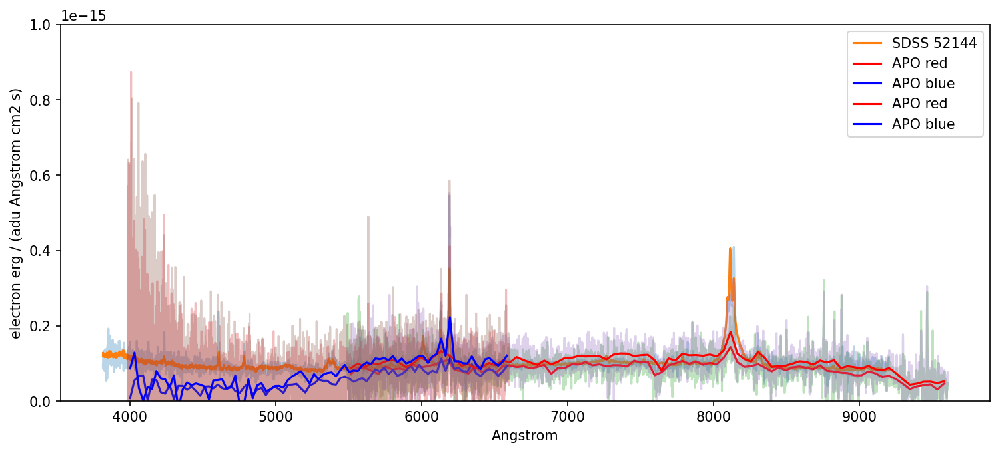

In [155]:
name = names[0]
sp = sdss_spectra
fig,ax=  plt.subplots(1,1, figsize=(12,5), facecolor='w', dpi=150)
for i in range(1):
    mjd = sp[i][0].header['MJD']
    spec = sp[i][1].data
    
    ax.plot(np.power(10,spec['loglam']), spec['flux']*1e-17, alpha=0.3)
    ax.plot(np.power(10,spec['loglam']), spec['model']*1e-17, label=f'SDSS {mjd}')
    
for i in range(2):
    x = qso_red_1d_fluxcal[i].spectral_axis.value
    y = qso_red_1d_fluxcal[i].flux.value
    statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=87)
    bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
    ax.plot(x,y, alpha=0.3)
    ax.plot(bin_centers, statistic, c='red', label='APO red')
    
    x = qso_blue_1d_fluxcal[i].spectral_axis.value
    y = qso_blue_1d_fluxcal[i].flux.value
    
    statistic, bin_edges, binnumber = binned_statistic(x,y, statistic='median', bins=87)
    bin_centers  =  (bin_edges[1:] + bin_edges[:-1] ) /2.
    ax.plot(x,y, alpha=0.3)
    ax.plot(bin_centers, statistic, c='blue', label='APO blue')

ax.set_xlabel(qso_red_1d_fluxcal[0].spectral_axis.unit)
ax.set_ylabel(qso_red_1d_fluxcal[0].flux.unit)
#ax.set_title('Flux Calibrated Spectrum  SDSSJ163620.38+475838.36 red&blue')  
ax.set_ylim(0,0.1e-14)
ax.legend()


Combine two red and two blue : 

Returning only the median per bin as there is only one exposure
Returning only the median per bin as there is only one exposure


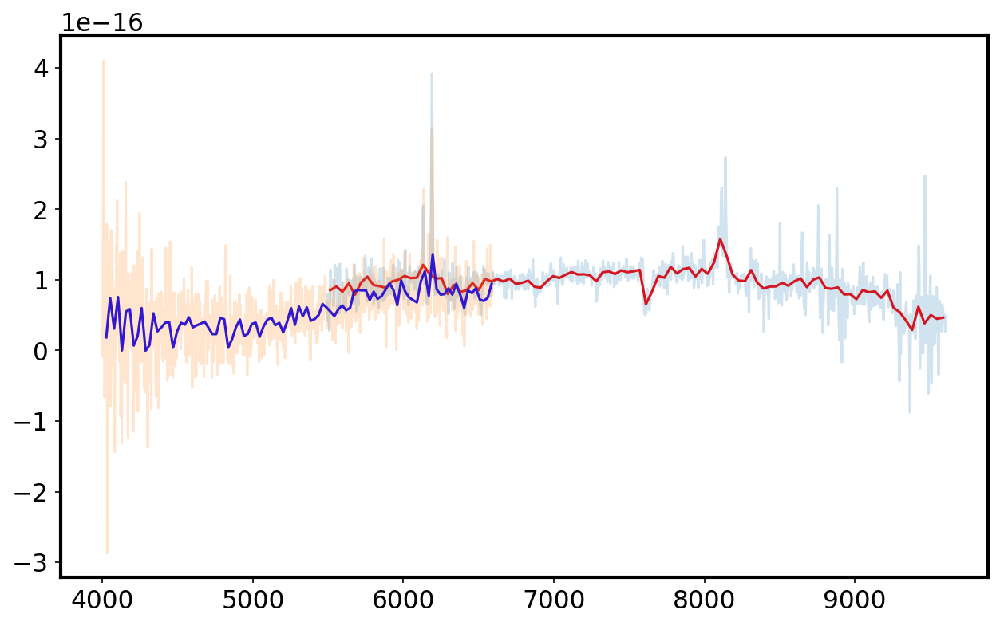

In [173]:
import functions as func
red_spectra = {}
for i in range(2):
    red_spectra[i] = {}
    red_spectra[i]['wavelength'] = qso_red_1d_fluxcal[i].spectral_axis.value
    red_spectra[i]['flux'] = qso_red_1d_fluxcal[i].flux.value
result_red = func.median_n_exposures(red_spectra, Nbins=100)
result_red_bkgnd = func.median_n_exposures(red_spectra, Nbins=1000)

blue_spectra = {}
for i in range(1): # only take the first exposure ... 
    blue_spectra[i] = {}
    blue_spectra[i]['wavelength'] = qso_blue_1d_fluxcal[i].spectral_axis.value
    blue_spectra[i]['flux'] = qso_blue_1d_fluxcal[i].flux.value
result_blue = func.median_n_exposures(blue_spectra, Nbins=100)
result_blue_bkgnd = func.median_n_exposures(blue_spectra, Nbins=1000)


fig, ax = plt.subplots(1,1, figsize=(10,6), dpi=150, facecolor='w')
ax.plot(result_red['bins'], result_red['flux_med_per_bin'], c='red', label='APO 2023-01-14 red' )
ax.plot(result_red_bkgnd['bins'], result_red_bkgnd['flux_med_per_bin'], alpha=0.2)


# only plot blue above 4000 A ,,,,
xmin = 4000
m1 = result_blue['bins'] > xmin

ax.plot(np.array(result_blue['bins'])[m1], 
        np.array(result_blue['flux_med_per_bin'])[m1], c='blue', label='APO 2023-01-14 blue' )
m2 = result_blue_bkgnd['bins'] > xmin
ax.plot(np.array(result_blue_bkgnd['bins'])[m2],
        np.array(result_blue_bkgnd['flux_med_per_bin'])[m2], alpha=0.2)



In [174]:
# Scale 
qso1_blue_flux_calib_spec1d = func.spectrum1d(result_blue['bins'], # spectral_axis.value 
                                         result_blue['flux_med_per_bin'],#.flux.value
                                         error=result_blue['flux_std_per_bin'])# .uncertainty.array)
qso1_red_flux_calib_spec1d = func.spectrum1d(result_red['bins'],
                                        result_red['flux_med_per_bin'],
                                        error=result_red['flux_std_per_bin'])
qso1_red_flux_calib_spec1d_sca = func.scale_spectra(qso1_red_flux_calib_spec1d, 
                                               qso1_blue_flux_calib_spec1d)


qso1_blue_flux_calib_spec1d_bkgnd = func.spectrum1d(result_blue_bkgnd['bins'], # spectral_axis.value 
                                         result_blue_bkgnd['flux_med_per_bin'],#.flux.value
                                         error=result_blue_bkgnd['flux_std_per_bin'])# .uncertainty.array)
qso1_red_flux_calib_spec1d_bkgnd = func.spectrum1d(result_red_bkgnd['bins'],
                                        result_red_bkgnd['flux_med_per_bin'],
                                        error=result_red_bkgnd['flux_std_per_bin'])
qso1_red_flux_calib_spec1d_sca_bkgnd = func.scale_spectra(qso1_red_flux_calib_spec1d_bkgnd, 
                                               qso1_blue_flux_calib_spec1d_bkgnd)

In [175]:
# Express as spectrum1d 

# the scaled red spectrum 
qso1_red_flux_1d_clean = specutils.Spectrum1D(
                 spectral_axis=qso1_red_flux_calib_spec1d_sca.wave*u.angstrom,
                 flux = qso1_red_flux_calib_spec1d_sca.flux*u.Unit('erg cm-2 s-1 AA-1'), 
                 uncertainty= qso1_red_flux_calib_spec1d_sca.error)

# the original blue 
qso1_blue_flux_1d_clean = specutils.Spectrum1D(
    spectral_axis=qso1_blue_flux_calib_spec1d.wave*u.angstrom,
    flux = qso1_blue_flux_calib_spec1d.flux*u.Unit('erg cm-2 s-1 AA-1'), 
    uncertainty= qso1_blue_flux_calib_spec1d.error
)
# the scaled red bkgnd 
qso1_red_flux_1d_clean_bkgnd = specutils.Spectrum1D(
                 spectral_axis=qso1_red_flux_calib_spec1d_sca_bkgnd.wave*u.angstrom,
                 flux = qso1_red_flux_calib_spec1d_sca_bkgnd.flux*u.Unit('erg cm-2 s-1 AA-1'), 
                 uncertainty= qso1_red_flux_calib_spec1d_sca_bkgnd.error)

# the original blue 
qso1_blue_flux_1d_clean_bkgnd  = specutils.Spectrum1D(
    spectral_axis=qso1_blue_flux_calib_spec1d_bkgnd .wave*u.angstrom,
    flux = qso1_blue_flux_calib_spec1d_bkgnd .flux*u.Unit('erg cm-2 s-1 AA-1'), 
    uncertainty= qso1_blue_flux_calib_spec1d_bkgnd .error
)

INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]


41.139794439389334 26.133364811354113
4.1139794439386606 2.613336481135775


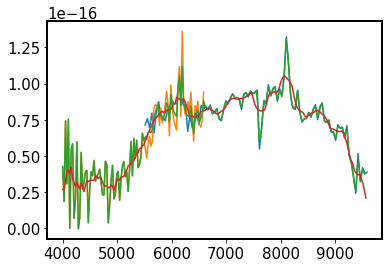

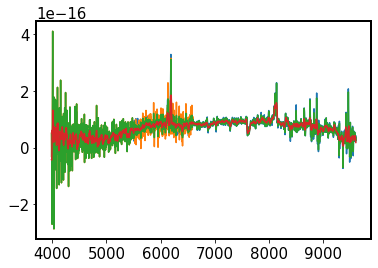

In [177]:

qso1_comb = func.combine_spectra(qso1_red_flux_1d_clean, 
                                 qso1_blue_flux_1d_clean)
header = qso_red_2d[0].header # take from either exposures,
#  no need to average from red to blue .... 
func.write_final_spectrum(header, qso1_comb, '230428_J163620_qso1_combined_spec')


qso1_comb_bkgnd = func.combine_spectra(qso1_red_flux_1d_clean_bkgnd,
                                       qso1_blue_flux_1d_clean_bkgnd)
header = qso_red_2d[0].header # take from either exposures,
#  no need to average from red to blue .... 
func.write_final_spectrum(header, qso1_comb_bkgnd, '230428_J163620_qso1_combined_spec_bkgnd')


Read in the **stored spectra: **

In [46]:
qso1_comb = Table.read('230428_J163620_qso1_combined_spec_combine.ascii',
                      format='ascii')

qso1_comb_bkgnd = Table.read('230428_J163620_qso1_combined_spec_bkgnd_combine.ascii',
                            format='ascii')

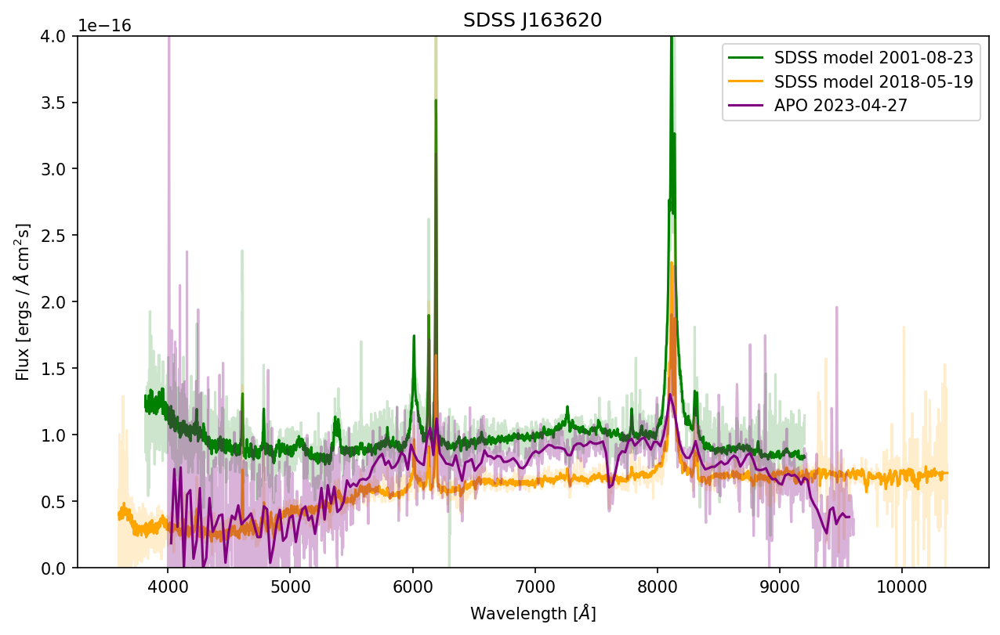

In [50]:
from astropy.time import Time

sp = sdss_spectra


sdss_colors = ['green', 'orange', 'red']
apo_color = 'purple'


from scipy.stats import binned_statistic
fig, ax = plt.subplots(1,1, figsize=(10,6), dpi=150, facecolor='w')
xmin = 4000
#ax.set_title('Flux Calibrated Spectrum  SDSSJ153355.99+011029.7 red&blue')  
ax.set_ylim(0,0.4e-15)

# first SDSS BOSS epoch 
i=0
#mjd = sp[i][0].header['MJD']
mjd_sdss = Time(sp[i][0].header['MJD'], format='mjd')
#mjd_sdss = Time(hdul[0].header['MJD'], format='mjd')
date_sdss = str(mjd_sdss.to_datetime()).split(' ')[0]
spec = sp[i][1].data
ax.plot(np.power(10,spec['loglam']), spec['flux']*1e-17, alpha=0.2,
       c=sdss_colors[i])
ax.plot(np.power(10,spec['loglam']), spec['model']*1e-17, label=f'SDSS model {date_sdss}',
       c=sdss_colors[i])


# second SDSS eBOSS epoch 
i=1
mjd_sdss = Time(hdul[0].header['MJD'], format='mjd')
date_sdss = str(mjd_sdss.to_datetime()).split(' ')[0]
sp1 = Table(hdul[1].data)
ax.plot(np.power(10,sp1['LOGLAM']), sp1['FLUX']*1e-17, alpha=0.2,  c=sdss_colors[i])
ax.plot(np.power(10,sp1['LOGLAM']), sp1['MODEL']*1e-17, label=f'SDSS model {date_sdss}',
       c=sdss_colors[i])



# plot the combined APO spectrum 
m = qso1_comb['wavelength'] > xmin
x = qso1_comb['wavelength'][m]
y = qso1_comb['flux'][m]
ax.plot(x, y, label='APO 2023-04-27',c=apo_color )
#ax.plot(x,convolve(y, Box1DKernel(2))) # very narrow 2px kernel... 

# plot the combined background
m = qso1_comb_bkgnd['wavelength'] > xmin
ax.plot(qso1_comb_bkgnd['wavelength'][m], 
        qso1_comb_bkgnd['flux'][m], #label='APO comb bkgnd' ,
       c=apo_color, alpha=0.3)


ax.set_xlabel('Wavelength '+ r'$[\AA]$')
ax.set_ylabel('Flux [ergs / '+r'$\AA \, $cm$^{2}$s]')
ax.set_title('SDSS J163620')  
ax.legend()

It seems to be basically at the same level as SDSS... Does the light curve agree? Yes - it seems to be same level   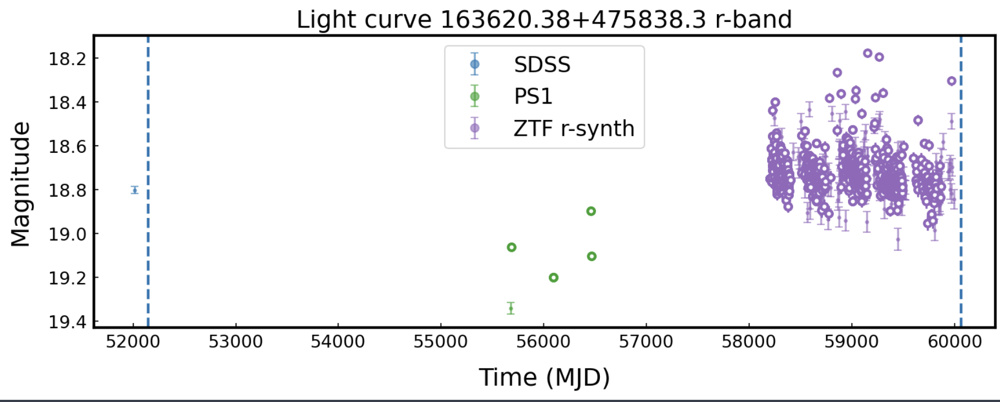 

# What's the Eddington ratio for that object? 
It  **should** be in DR16Q, but who knows.... 

In [184]:
hdul = fits.open("DR16Q_Superset_v3.fits")
sdss_name = hdul[1].data['SDSS_NAME'] #
sdss_idx  = np.arange(len(sdss_name))
sdss_jid = '153355.99+011029.7'
select = np.in1d(sdss_name, sdss_jid)
select_idx = sdss_idx[select]
dr16q_select = Table(hdul[1].data[select_idx])

In [185]:
dr16q_select

SDSS_NAME,RA,DEC,PLATE,MJD,FIBERID,AUTOCLASS_PQN,AUTOCLASS_DR14Q,IS_QSO_QN,Z_QN,RANDOM_SELECT,Z_10K,Z_CONF_10K,PIPE_CORR_10K,IS_QSO_10K,PRIM_REC,THING_ID,Z_VI,Z_CONF,CLASS_PERSON,Z_DR12Q,IS_QSO_DR12Q,Z_DR7Q_SCH,IS_QSO_DR7Q,Z_DR6Q_HW,Z_DR7Q_HW,IS_QSO_FINAL,Z,SOURCE_Z,Z_PIPE,ZWARNING,OBJID,Z_PCA,ZWARN_PCA,DELTACHI2_PCA,Z_HALPHA,ZWARN_HALPHA,DELTACHI2_HALPHA,Z_HBETA,ZWARN_HBETA,DELTACHI2_HBETA,Z_MGII,ZWARN_MGII,DELTACHI2_MGII,Z_CIII,ZWARN_CIII,DELTACHI2_CIII,Z_CIV,ZWARN_CIV,DELTACHI2_CIV,Z_LYA,ZWARN_LYA,DELTACHI2_LYA,Z_DLA,NHI_DLA,CONF_DLA,BAL_PROB,BI_CIV,ERR_BI_CIV,AI_CIV,ERR_AI_CIV,BI_SIIV,ERR_BI_SIIV,AI_SIIV,ERR_AI_SIIV,BOSS_TARGET1,EBOSS_TARGET0,EBOSS_TARGET1,EBOSS_TARGET2,ANCILLARY_TARGET1,ANCILLARY_TARGET2,NSPEC_SDSS,NSPEC_BOSS,NSPEC,PLATE_DUPLICATE,MJD_DUPLICATE,FIBERID_DUPLICATE,SPECTRO_DUPLICATE,SKYVERSION,RUN_NUMBER,RERUN_NUMBER,CAMCOL_NUMBER,FIELD_NUMBER,ID_NUMBER,LAMBDA_EFF,ZOFFSET,XFOCAL,YFOCAL,CHUNK,TILE,PLATESN2,PSFFLUX,PSFFLUX_IVAR,PSFMAG,PSFMAGERR,EXTINCTION,SN_MEDIAN_ALL
str18,float64,float64,int32,int32,int16,str6,str6,int16,float64,int16,float64,int16,int16,int16,int16,int64,float64,int16,int16,float64,int16,float64,int16,float64,float64,int16,float64,str12,float64,int32,str19,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64[5],float64[5],float64[5],float32,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int32,int32,int32,int32[74],int32[74],int16[74],int16[74],uint8,int32,str3,int32,int32,int32,float64,float64,float64,float64,str14,int32,float64,float32[5],float64[5],float32[5],float64[5],float32[5],float64


In [186]:
Table(hdul[1].data[:3])

SDSS_NAME,RA,DEC,PLATE,MJD,FIBERID,AUTOCLASS_PQN,AUTOCLASS_DR14Q,IS_QSO_QN,Z_QN,RANDOM_SELECT,Z_10K,Z_CONF_10K,PIPE_CORR_10K,IS_QSO_10K,PRIM_REC,THING_ID,Z_VI,Z_CONF,CLASS_PERSON,Z_DR12Q,IS_QSO_DR12Q,Z_DR7Q_SCH,IS_QSO_DR7Q,Z_DR6Q_HW,Z_DR7Q_HW,IS_QSO_FINAL,Z,SOURCE_Z,Z_PIPE,ZWARNING,OBJID,Z_PCA,ZWARN_PCA,DELTACHI2_PCA,Z_HALPHA,ZWARN_HALPHA,DELTACHI2_HALPHA,Z_HBETA,ZWARN_HBETA,DELTACHI2_HBETA,Z_MGII,ZWARN_MGII,DELTACHI2_MGII,Z_CIII,ZWARN_CIII,DELTACHI2_CIII,Z_CIV,ZWARN_CIV,DELTACHI2_CIV,Z_LYA,ZWARN_LYA,DELTACHI2_LYA,Z_DLA,NHI_DLA,CONF_DLA,BAL_PROB,BI_CIV,ERR_BI_CIV,AI_CIV,ERR_AI_CIV,BI_SIIV,ERR_BI_SIIV,AI_SIIV,ERR_AI_SIIV,BOSS_TARGET1,EBOSS_TARGET0,EBOSS_TARGET1,EBOSS_TARGET2,ANCILLARY_TARGET1,ANCILLARY_TARGET2,NSPEC_SDSS,NSPEC_BOSS,NSPEC,PLATE_DUPLICATE,MJD_DUPLICATE,FIBERID_DUPLICATE,SPECTRO_DUPLICATE,SKYVERSION,RUN_NUMBER,RERUN_NUMBER,CAMCOL_NUMBER,FIELD_NUMBER,ID_NUMBER,LAMBDA_EFF,ZOFFSET,XFOCAL,YFOCAL,CHUNK,TILE,PLATESN2,PSFFLUX,PSFFLUX_IVAR,PSFMAG,PSFMAGERR,EXTINCTION,SN_MEDIAN_ALL
str18,float64,float64,int32,int32,int16,str6,str6,int16,float64,int16,float64,int16,int16,int16,int16,int64,float64,int16,int16,float64,int16,float64,int16,float64,float64,int16,float64,str12,float64,int32,str19,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64,int64,float64,float64[5],float64[5],float64[5],float32,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int32,int32,int32,int32[74],int32[74],int16[74],int16[74],uint8,int32,str3,int32,int32,int32,float64,float64,float64,float64,str14,int32,float64,float32[5],float64[5],float32[5],float64[5],float32[5],float64
000000.04+064602.3,0.00018665679641571842,6.76732079016156,11279,58449,85,STAR,STAR,0,2.029855950475439,0,-1.0,-1,-1,-1,0,171139738,-1.0,0,0,-1.0,0,-1.0,-1,-1.0,-1.0,0,-0.0007221271516755223,PIPE,-0.0007221271516755223,0,1237669516904956169,-0.0010385384062535003,0,1132.9830964645662,-0.006532869837715616,0,20.70782451357671,0.00642469482051955,0,19.325714654838947,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0,2048,0,0,0,0,0,-1,0 .. 0,0 .. 0,0 .. 0,0 .. 0,2,5598,301,2,115,265,4000.0,0.0,223.01914978027344,-30.65087890625,eboss26,17451,15.228899955749512,2.2861543 .. 16.25594,17.657251358032227 .. 2.098268508911133,21.598186 .. 19.470226,0.11218223720788956 .. 0.04591865837574005,0.22029035 .. 0.06563499,8.41004467010498
000000.04+064602.3,0.00018665679641571842,6.76732079016156,8740,57367,666,STAR,STAR,0,2.052054929960373,0,-1.0,-1,-1,-1,1,171139738,-1.0,0,0,-1.0,0,-1.0,-1,-1.0,-1.0,0,-0.0006849321653135121,PIPE,-0.0006849321653135121,0,1237669516904956169,-0.0012602803555309427,0,1061.7727170992794,-0.013002711741104789,0,20.092706537795053,-0.004539775797728796,0,45.07873668910747,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0,2048,0,0,0,0,0,-1,0 .. 0,0 .. 0,0 .. 0,0 .. 0,2,5598,301,2,115,265,4000.0,0.0,-80.42298889160156,210.67645263671875,eboss9,16078,18.602399826049805,2.2861543 .. 16.25594,17.657251358032227 .. 2.098268508911133,21.598186 .. 19.470226,0.11218223720788956 .. 0.04591865837574005,0.22029035 .. 0.06563499,10.49886417388916
000000.05+272811.6,0.00021481019643943,27.469903330451316,7695,57654,574,STAR,STAR,0,2.1206189463490532,0,-1.0,-1,-1,-1,1,349500180,-1.0,0,0,-1.0,0,-1.0,-1,-1.0,-1.0,0,-0.0008394881733693182,PIPE,-0.0008394881733693182,0,1237663233379074508,-0.0006941207945846007,0,71.91637864054883,-0.008324720314193068,0,20.50070412900928,-0.011810769608032512,0,25.30914729686367,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0,7682,0.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0 .. -1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0,0,2048,0,0,0,0,0,-1,0 .. 0,0 .. 0,0 .. 0,0 .. 0,2,4135,301,2,287,460,4000.0,0.0,-216.42160034179688,21.2004146575

Seems not to be there ! How is it possible if there is a spectrum available, and obviously based on that spectrum the MBH and LBol were estimated ? 

Check by ra/dec:  

In [188]:
ra = 249.084925	
dec = 47.977324
delta = 5/3600.
m1 = np.abs(hdul[1].data['RA'] - ra) < delta
m2 = np.abs(hdul[1].data['DEC'] - dec) < delta
m = m1*m2

In [189]:
np.sum(m)

1

In [191]:
a=  Table(hdul[1].data[m])

ok, it's right there!  Green+2022 Sec. 5 guides through the calculation of  LEdd from MBh , and MBh is derived from L5100 continuum fit, iron to Hbeta flux  - results of pyQSOfit. 


So what we need is really running pyQSOfit on the sample. 

In [194]:
for a  in list(a.columns):
     if 'edd' in a :
            print(a)

In [195]:
a

'SN_MEDIAN_ALL'

ok, instead of looking here - I already have Ledd for the quasars in question from Schneider DR7. Of course, this would be the earlier SDSS epoch - would need to confirm what is the case ...  

In [ ]:
That was done in the 